## Summary:

The **goal** in this project is **train a CNN model** that can take a picture of any mushroom and tell us with a high degree of confidence whether if it is an edible, a poisoness mushroom or neither (no_value mushroom).

Mushrooms represent an important food source and they are used extensively in cooking, in many cuisines (notably Chinese, Korean, European, and Japanese). Furthermore, many people enjoy mushroom collection as a outdoor activity. However, this activity, entails some health risk, since some species that are poisoness look similar to edible specimens. In the example below I present such case of similarity between a delicious and edible mushroom *Macrolepiota mastoidea* and a *Amanita phaloides* which ingestion can lead to death.

Hence, it is important to discern what mushrooms are safe to pick, and which entail some risk.

In this notebook, I will train an algorithm that can aid us with our picking mushroom dilema.

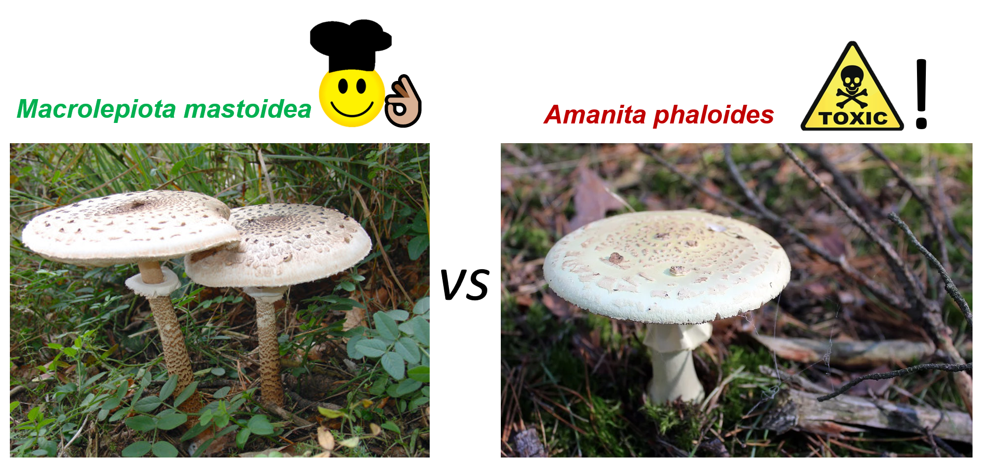

In [3]:
import PIL # image library tool

PIL.Image.open(r".\figures\edible_vs_toxic.png")

Import Neccesary Libraries

In [1]:
# Data Handling
import numpy as np
import pandas as pd
import random
import datetime as dt
import itertools

# Data Scrapping
from bs4 import BeautifulSoup # to scrape pictures and data from different websites
import requests
import csv
import re
from simple_image_download import simple_image_download as simp # to easily scrape google images
from bing_image_downloader import downloader # to easily scrape bing images
from tqdm.notebook import tqdm # to track the progress
import time # to avoid suspicius behaviour while scrapping

# Image Library Tools
import cv2 # OpenCv: computer vision applications
from tensorflow.keras.preprocessing import image # we can use img = image.load_img(path, target_size=(,)) and image.img_to_array(img)
import pathlib # will be useful when reading the image paths
import PIL # image library tool

# Directories
import glob
import os,sys
import shutil

# Data Split and Data Preprocessing
import splitfolders # a library to re-structure the images into three subfolders(train/valid/test)
from sklearn.model_selection import train_test_split
from keras.preprocessing.image import ImageDataGenerator 

# Modeling
import tensorflow as tf
from tensorflow import keras
import tensorflow as tf
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential

# Plotting
import matplotlib.pyplot as plt
import matplotlib as mpl
import seaborn as sns

# Model Evaluation
from sklearn.metrics import confusion_matrix
from sklearn import metrics


# Ignoring warnings
import warnings
warnings.filterwarnings("ignore")

In [84]:
pd.set_option("display.max_rows", 1000)

In [4]:
!python -V

Python 3.7.4


## 1. Scrape mushroom names

This will be the most time consuming part. I will divide this task in several parts:

**1.1** Get all the scientific names for each class of mushroom. I will use several websites and resources for this.

Good **candidate websites** for mushroom data scrapping:

* https://www.fungipedia.org/hongos.html
* https://www.wildfooduk.com/mushroom-guide/
* http://www.fichasmicologicas.com/?micos=1&alf=*&s=suillus%20luteus&art=401

**1.2** Use the scientific names to scrape pictures.

* The dictionary below was obtained from [governamental information](http://selvicultor.net/redfor/wp-content/uploads/Catalogo-variedades-comerciales-hongos_RedFor.pdf) about commercial mushrooms and non-commercial in Spain

In [5]:
dict_boe = {"edible" : 
 ["Agaricus campestris",
"Agaricus sylvaticus",
"Agrocybe aegerita",
"Amanita caesarea",
"Amanita ponderosa",
"Boletus aereus",
"Boletus edulis",
"Boletus pinophilus",
"Boletus reticulatus"
"Calocybe gambosa",
"Cantharellus cibarius",
"Cantharellus cinereus",
"Cantharellus lutescens",
"Cantharellus tubaeformis",
"Cantharellus subpruinosus",
"Clitocybe geotropa",
"Craterellus cornucopioides",
"Fistulina hepatica",
"Helvella sp",
"Higrocybe pratensis",
"Hydnum albidum",
"Hydnum repandum",
"Hydnum rufescens",
"Hygrophorus agathosmus",
"Hygrophorus gliocyclus",
"Hygrophorus latitabundus",
"Hygrophorus marzuolus",
"Hygrophorus penarius",
"Hygrophorus russula",
"Lactarius deliciosus",
"Lactarius quieticolor",
"Lactarius salmonicolor",
"Lactarius sanguifluus",
"Lactarius semisanguifluus",
"Lepista panaeolus",        
"Lepista nuda",
"Lepista personata",
"Macrolepiota procera",
"Marasmius oreades",
"Morchella sp",
"Pleurotus eryngii",
"Pleurotus ostreatus",
"Rhizopogon luteolus",
"Rhizopogon roseolus",
"Russula cyanoxantha",
"Russula virescens",
"Suillus luteus",
"Terfezia arenaria",
"Terfezia claveryi",
"Terfezia leptoderma",
"Tricholoma portentosum",
"Tricholoma terreum",
"Tuber aestivum",
"Tuber borchii",
"Tuber brumale",
"Tuber indicum",
"Tuber magnatum",
"Tuber melanosporum",
"Ustilago maydis",
"Xerocomus badius",
"Agaricus arvensis",
"Agaricus bisporus",
"Agaricus bitorquis",
"Agaricus blazei",
"Agaricus brunnescens",
"Agrocybe aegerita",
"Auricularia auricula-judae",
"Auricularia polytricha",
"Coprinus comatus",
"Flammulina velutipes",
"Grifola frondosa",
"Hericium erinaceus",
"Lentinula edodes",
"Lepista nuda",
"Lepista personata",
"Hypsizygus marmoreus",
"Hypsizygus tessulatus",
"Pholiota nameko",
"Pleurotus cystidiosus",
"Pleurotus cornucopiae",
"Pleurotus djamor",
"Pleurotus eryngii",
"Pleurotus fabellatus",
"Pleurotus nebrodensis",
"Pleurotus ostreatus",
"Pleurotus pulmonarius",
"Pleurotus sajor-caju",
"Pleurotus tuber-regium",
"Sparassis crispa",
"Stropharia rugosoannulata",
"Tremella fuciformis",
"Tremella mesenterica",
"Tricholoma caligatum",
"Volvariella volvacea"],
            
"no-edible": 
["Agaricus iodosmus",
"Agaricus moelleri",
"Agaricus placomyces",
"Agaricus xanthodermus",
"Amanita gemmata",
"Amanita muscaria",
"Amanita pantherina",
"Amanita phalloides",
"Amanita porrinensis",
"Amanita proxima",
"Amanita verna",
"Amanita virosa",
"Boletus lupinus",
"Boletus pulchrotinctus",
"Boletus rhodoxanthus",      
"Boletus satanas",
"Choiromyces meandriformis",
"Clitocybe acromelalga",
"Clitocybe alnetorum",
"Clitocybe amoenolens",
"Clitocybe candicans",
"Clitocybe cerussata",
"Clitocybe clavipes",
"Clitocybe dealbata",
"Clitocybe diatreta",
"Clitocybe ericetorum",
"Clitocybe festiva",
"Clitocybe gracilipes",
"Clitocybe nebularis",
"Clitocybe phyllophila",
"Clitocybe rivulosa",
"Conocybe",
"Coprinus atramentarius",
"Coprinus romagnesianus",
"Cortinarius",
"Entoloma lividum",
"Entoloma nidorosum",
"Entoloma niphoides",
"Entoloma rhodopolium",
"Entoloma vernum",
"Galerina sp",
"Gymnopilus sp",
"Gyromitra sp",
"Hebeloma crustuliniforme",
"Hebeloma sinapizans",
"Hypholoma fasciculare",
"Hypholoma sublateritium",
"Hygrocybe conica",
"Inocybe sp",
"Lactarius chrysorrheus",
"Lactarius helvus",
"Lactarius necator",
"Lactarius torminosus",
"Lepiota sp",
"Macrolepiota rachodes",
"Macrolepiota venenata",
"Mycena pura",
"Mycena rosea",
"Omphalotus illudens",
"Omphalotus olearius",
"Panaeolus sp",
"Paxillus filamentosus",
"Paxillus involutus",
"Pholiota squarrosa",
"Pholiotina sp",
"Pleurocybella porrigens",
"Pluteus nigroviridis",
"Pluteus salicinus",
"Psilocybe sp",
"Ramaria formosa",
"Russula emetica",
"Scleroderma sp",
"Stropharia aeruginosa",
"Stropharia coronilla",
"Stropharia cyanea",
"Stropharia semiglobata",
"Stropharia stercoraria",
"Tricholoma auratum",
"Tricholoma equestre",
"Tricholoma filamentosum",
"Tricholoma flavovirens",
"Tricholoma josserandii",
"Tricholoma pardinum",
"Tricholoma sulfureum",
"Tricholoma scioides",
"Tricholoma sejunctum",
"Tricholoma virgatum"]
}

In [42]:
len(dict_boe["edible"])

93

In [43]:
len(dict_boe["no-edible"])

87

Next I will scrape mode data from other websites using the beautiful soup library

* I will start with https://www.fungipedia.org/hongos.html which has 540 mushroom types classified

In [7]:
headers = requests.utils.default_headers()
headers.update({
    'User-Agent': 'Mozilla/5.0 (X11; Ubuntu; Linux x86_64; rv:52.0) Gecko/20100101 Firefox/52.0',
})

In [8]:
website = "https://www.fungipedia.org/hongos.html?start=0"
source = requests.get(website, headers=headers).content
html_soup = BeautifulSoup(source, 'lxml')

In [9]:
html_soup.select("img.comest")[0]["title"]

'Abortiporus biennis - sin valor'

In [10]:
len(html_soup.select("img.comest"))

20

In [11]:
name_class = []

for i in list(range(0,540,20)):
    website = "https://www.fungipedia.org/hongos.html?start={}".format(i)
    source = requests.get(website, headers=headers).content
    html_soup = BeautifulSoup(source, 'lxml')
    
    for j in range(len(html_soup.select("img.comest"))):
        name = html_soup.select("img.comest")[j]["title"]
        name_class.append(name)

In [12]:
len(name_class)

540

In [14]:
df_mushrooms = pd.Series(name_class).str.split(" - ", expand=True)

In [15]:
df_mushrooms.columns = ["name", "class"]

In [16]:
df_mushrooms["class"].value_counts().sum()

540

In [17]:
def class_grouper(item):
    if item == "sin valor":
        return "no_value"
    elif item in ["comestible", "buen comestible", "excelente comestible", "comestible precaucion", "excelente comestible precaucion"]:
        return "edible"
    elif item in ["toxica", "mortal", "no comestible"]:
        return "toxic"

In [18]:
df_mushrooms["three_classes"] = df_mushrooms["class"].apply(class_grouper)

In [21]:
df_mushrooms["three_classes"].value_counts() #540 total ✔

no_value    243
edible      175
toxic       122
Name: three_classes, dtype: int64

* A similar classification is available in a website from UK (https://www.wildfooduk.com/mushroom-guide/). Lets scrape that data as well and combine the results

In [22]:
names = []
mushroom_classes = []
website = "https://www.wildfooduk.com/mushroom-guide/"
source = requests.get(website, headers=headers).content
html_soup = BeautifulSoup(source, 'lxml')

for i in range(len(html_soup.select("td.spotlight-text"))):
    name = html_soup.select("td.spotlight-text")[i].get_text(" ", strip=True)
    mushroom_class = html_soup.select("td.mushroom-icon")[i].img["alt"]
    names.append(name)
    mushroom_classes.append(mushroom_class)
    

In [23]:
columns_scrap = (list(zip(names, mushroom_classes)))

mushroom_uk = pd.DataFrame(columns_scrap, columns =["name", "classes"])


In [24]:
mushroom_uk["classes"].value_counts()

Edible       93
Poisonous    34
Inedible     18
Name: classes, dtype: int64

In [25]:
def class_grouper_uk(item):
    if item == "Inedible":
        return "no_value"
    elif item == "Edible":
        return "edible"
    elif item == "Poisonous":
        return "toxic"

In [26]:
mushroom_uk["classes"] = mushroom_uk["classes"].apply(class_grouper_uk)

In [29]:
df = pd.merge(df_mushrooms,mushroom_uk,on=['name'], how='outer') 

In [31]:
df["three_classes"].fillna(df["classes"], inplace=True)

In [33]:
df_boe = pd.concat([pd.Series(dict_boe["edible"]),pd.Series(dict_boe["no-edible"])])

In [34]:
df_boe = df_boe.reset_index(drop=True)

In [35]:
df_boe = df_boe.reset_index()

In [47]:
def edible_or_toxic(item):
    if item >= 0 and item < 93:
        return "edible"
    else:
        return "toxic"

In [48]:
df_boe["classes"] = df_boe["index"].apply(edible_or_toxic)

In [49]:
df_boe = df_boe.drop("index", axis=1)

In [50]:
df_boe.columns = ["name", "classes"]

In [51]:
df = pd.merge(df,df_boe,on=['name'], how='outer') 

In [53]:
df["three_classes"].fillna(df["classes_y"], inplace=True)

In [54]:
df = df.drop(["class", "classes_x", "classes_y"], axis=1)

In [55]:
df["three_classes"].value_counts()

edible      260
no_value    257
toxic       198
Name: three_classes, dtype: int64

* Next I will scrape and combined data from the [wikipedia website](https://en.wikipedia.org/wiki/List_of_poisonous_fungus_species)

In [82]:
names_toxic = []
website = "https://en.wikipedia.org/wiki/List_of_poisonous_fungus_species"
source = requests.get(website, headers=headers).content
html_soup = BeautifulSoup(source, 'lxml')

for i in range(len(html_soup.select("i a"))):
    name = html_soup.select("i a")[i]["title"]
    names_toxic.append(name)

In [85]:
names_toxic = pd.Series(names_toxic).drop_duplicates()

In [94]:
names_toxic = names_toxic.reset_index(drop=True)

In [107]:
names_toxic = names_toxic.str.split("(", expand=True)[0]

In [160]:
names_edible = []
website = "https://en.wikipedia.org/wiki/Edible_mushroom"
source = requests.get(website, headers=headers).content
html_soup = BeautifulSoup(source, 'lxml')

for i in range(88):
    name = html_soup.select("li i a")[i]["title"]
    names_edible.append(name)

In [163]:
names_edible = pd.Series(names_edible).drop_duplicates()

In [164]:
names_edible = names_edible.reset_index(drop=True)

In [166]:
names_edible = names_edible.str.split("(", expand=True)[0]

In [170]:
len(names_edible)

80

In [171]:
len(names_toxic)

202

In [177]:
names_edible

0              Agaricus bisporus
1                      Pleurotus
2               Lentinula edodes
3     Auricularia auricula-judae
4           Volvariella volvacea
                 ...            
75      Coprinopsis atramentaria
76                      Coprinus
77                     Gyromitra
78                     Lactarius
79                 Lepista saeva
Name: 0, Length: 80, dtype: object

In [176]:
wiki_df[:80]

0              Agaricus bisporus
1                      Pleurotus
2               Lentinula edodes
3     Auricularia auricula-judae
4           Volvariella volvacea
                 ...            
75      Coprinopsis atramentaria
76                      Coprinus
77                     Gyromitra
78                     Lactarius
79                 Lepista saeva
Name: 0, Length: 80, dtype: object

In [174]:
wiki_df = pd.concat([names_edible, names_toxic]).reset_index(drop=True)

In [187]:
wiki_df = wiki_df.reset_index()

In [188]:
def edible_or_toxic(item):
    if item >= 0 and item < 80:
        return "edible"
    else:
        return "toxic"

In [189]:
wiki_df["classes"] = wiki_df["index"].apply(edible_or_toxic)

In [191]:
wiki_df.columns = ["index", "name", "classes"]

In [194]:
wiki_df = wiki_df.drop("index", axis=1)

In [196]:
df = pd.merge(df,wiki_df,on=['name'], how='outer') 

In [198]:
df["three_classes"].fillna(df["classes"], inplace=True)

In [200]:
df = df.drop("classes", axis=1)

In [206]:
df = df.drop_duplicates().reset_index(drop=True)

In [208]:
df["three_classes"].value_counts() # -%10, -20%

toxic       321
edible      286
no_value    257
Name: three_classes, dtype: int64

In [211]:
df = df.drop("Unnamed: 0", axis=1)

I need to perform some **data cleaning** on this df

In [371]:
df_mush = df.sort_values(["three_classes", "name"]).reset_index(drop=True).drop([12,13])

In [372]:
df_mush["name"] = df_mush["name"].str.replace("Boletus / ", "")

In [373]:
df_mush = df_mush.sort_values(["three_classes", "name"])

In [374]:
df_mush = df_mush.reset_index(drop=True)

In [375]:
df_mush.iloc[39, :]["name"] = "Calocybe gambosa"

In [376]:
df_mush.shape

(862, 2)

In [377]:
df_mush["name"] = df_mush["name"].str.lower()

In [378]:
df_mush = df_mush.drop_duplicates()

In [379]:
df_mush = df_mush.reset_index(drop=True)

In [380]:
df_mush.shape

(852, 2)

In [381]:
df_mush["name"] = df_mush["name"].str.capitalize()

In [385]:
df_mush = df_mush.drop(50).reset_index(drop=True)

In [394]:
df_mush = df_mush.drop([384, 549, 568, 646, 647, 714, 812,833, 840, 841, 850]).reset_index(drop=True)

Lets see what are the value counts for each name. Since I got the names from several resources there may be inconsistances.

In [24]:
df_mush["name"].value_counts()

Caloboletus radicans        2
Suillus bovinus             2
Chalciporus piperatus       2
Hortiboletus rubellus       2
Tylopilus felleus           2
                           ..
Coprinopsis ephemeroides    1
Agaricus augustus           1
Galerina sp                 1
Clitocybe rivulosa          1
Coprinus romagnesianus      1
Name: name, Length: 833, dtype: int64

Indeed, there are 7 mushrooms that appear in two groups at the same time. (Missclassifed as edible, toxic or no value). Lets inspects these cases.

In [22]:
list_misclassified = list(df_mush["name"].value_counts()[:7].index)

In [ ]:
df_mush["name"] = df_mush["name"].str.strip() # we need to take care os some spaces after the names since can yield duplicates

In [27]:
df_mush.loc[df_mush["name"].isin(list_misclassified)]

,name,three_classes
56,Chalciporus piperatus,edible
108,Hortiboletus rubellus,edible
174,Morchella,edible
237,Suillus bovinus,edible
294,Caloboletus calopus,no_value
295,Caloboletus radicans,no_value
395,Hortiboletus rubellus,no_value
500,Suillus bovinus,no_value
521,Tylopilus felleus,no_value
599,Caloboletus calopus,toxic


1) *Chalciporus piperatus* "**This mushroom is edible but very peppery**". [Source](https://en.wikipedia.org/wiki/Chalciporus_piperatus): Remove it from toxic list.

2) *Hortiboletus rubellus* "**There is some question over its edibility, and it is reportedly of poor quality with a taste of soap**". [Source](https://en.wikipedia.org/wiki/Hortiboletus_rubellus): Remove it from edible list.

3) Morchella. This is a genus with about 80 species. Overall highly appreciated. [Source](https://en.wikipedia.org/wiki/Morchella) Remove from toxic.

4) *Suillus bovinus*. It is an edible mushroom, though not highly regarded. [Source](https://en.wikipedia.org/wiki/Suillus_bovinus) Remove from no_value.

5) *Caloboletus calopus* [Source](https://en.wikipedia.org/wiki/Caloboletus_calopus) Although Caloboletus calopus is not typically considered edible due to an intensely bitter taste that does not disappear with cooking, there are reports of it being consumed in eastern Europe. Remove from toxic.

6) *Caloboletus radicans* "**Bitter and inedible, it can cause severe vomiting and diarrhoea if eaten**".[Source](https://en.wikipedia.org/wiki/Caloboletus_radicans) Remove from no_value.

7) *Tylopilus felleus* "Although **not poisonous**, it is generally considered inedible due to its overwhelming bitterness". [Source](https://en.wikipedia.org/wiki/Tylopilus_felleus). Remove from toxic.


In [50]:
df_mush = df_mush.drop([602, 108, 744, 500, 599, 295, 839]).reset_index(drop=True)
df_mush = df_mush.drop([255]).reset_index(drop=True) # remove also tuber since this is not exclusive for mushrooms

In [182]:
df_mush.to_csv("final_mush_815.csv", index=False)

In [171]:
df_mush = pd.read_csv("final_df_mush.csv")

In [18]:
df_mush = df_mush.drop([52, 464, 530, 210 ]).reset_index(drop=True)

In [175]:
df_mush = df_mush.drop([118, 226, 270, 271 ]).reset_index(drop=True)

In [178]:
df_mush = df_mush.drop([134]).reset_index(drop=True)

In [183]:
df_mush.shape

(815, 2)

In [22]:
df_mush["three_classes"].value_counts() 

toxic       302
edible      266
no_value    252
Name: three_classes, dtype: int64

In [36]:
edible = list(df_mush.loc[(df_mush["three_classes"]=="edible")]["name"]) # scrape 400 pic each

In [187]:
toxic = list(df_mush.loc[(df_mush["three_classes"]=="toxic")]["name"]) 

In [38]:
no_value = list(df_mush.loc[(df_mush["three_classes"]=="no_value")]["name"]) 

* I will use a [last website](http://www.fichasmicologicas.com/?micos=1&alf=*&art=401) that I found containing more scienfitic names to expand the name list even further

In [13]:
extra_names=[]

headers = requests.utils.default_headers()
headers.update({
    'User-Agent': 'Mozilla/5.0 (X11; Ubuntu; Linux x86_64; rv:52.0) Gecko/20100101 Firefox/52.0',
})

website = "http://www.fichasmicologicas.com/?micos=1&alf=*&art=401"
source = requests.get(website, headers=headers).content
html_soup = BeautifulSoup(source, 'lxml')

for i in range(len(html_soup.select("div.col43 a"))):
    name = html_soup.select("div.col43 a")[i].text
    extra_names.append(name)

In [14]:
len(extra_names)

1580

In [15]:
names_824 = list(pd.read_csv("final_mush_824.csv").name)

In [16]:
total_names = names_824 + extra_names

In [17]:
total_names = list(set(total_names))

In [18]:
total_names.sort()

In [19]:
len(total_names)

2000

In [ ]:
total_names.to_csv("All_names.csv")

* I obtained a total of 2000 mushroom species. Next I will remove the "var." species and some duplicates. This yielded a total of **1911 total mushrooms species.**

> From these species I will select the most popular ones and I will also try to avoid names used interchangeably.

> For this I defined a function ``finder`` to scprape the hits from a google search with "Word1 Word2" in quotations to get an idea of the popularity of each specie.

> A second function ``parse_value_syntax`` was used to parse the value into a float.

In [2]:
df_all_names = pd.read_csv("All_names.csv")

In [4]:
df_all_names = df_all_names.drop("Unnamed: 0", axis=1)

In [89]:
df_words = df_all_names["names"].str.split(expand=True)

In [92]:
df_words = df_words.iloc[:, :2]

In [93]:
df_words.columns = ["word1", "word2"]

In [96]:
df_all_names = pd.concat([df_all_names, df_words], axis=1)

In [100]:
df_all_names = df_all_names.drop_duplicates(subset=["word1", "word2"])

In [102]:
df_all_names.reset_index(inplace=True, drop=True)

In [ ]:
def finder(word1, word2):
    
    headers = requests.utils.default_headers()

    headers.update({
        'User-Agent': 'Mozilla/5.0 (X11; Ubuntu; Linux x86_64; rv:52.0) Gecko/20100101 Firefox/52.0',
    })

    website = 'https://www.google.com/search?q={}+{}'.format(word1, word2)
    source = requests.get(website, headers=headers).content
    html_soup = BeautifulSoup(source, 'lxml')


    time.sleep(1.800)
    
    return html_soup.find("div", attrs={"id":"result-stats"}).text


In [ ]:
df_all_names['Results_Google'] = df_all_names.apply(lambda x: finder(x['word1'], x['word2']), axis=1)

In [153]:
number = r"\d+(\d{3})*\.\d+"

def parse_value_syntax(string):
    
    """takes a string and parse the number in format xxx.xxx"""
    
    try:
        value_string = re.search(number, string).group()
        value = float(value_string.replace(".", ""))
        return value
    except AttributeError:
        return 0

In [ ]:
df_all_names["Number_Hits_Google"] = df_all_names["Results_Google"].apply(parse_value_syntax)

In [157]:
df_all_names.to_csv("All_names_google_results.csv")

In [ ]:
google_results = pd.read_csv("All_names_google_results.csv")

In [166]:
google_results

,names,word1,word2,Results_Google,Number_Hits_Google
122,Amanita petalinivolva,Amanita,petalinivolva,"Aproximadamente 264 resultados (0,40 segundos)",0.0
1526,Pseudoclitopilus rhodoleucus,Pseudoclitopilus,rhodoleucus,"Aproximadamente 510 resultados (0,34 segundos)",0.0
1715,Stereum sanguinolentun,Stereum,sanguinolentun,"Aproximadamente 886 resultados (0,45 segundos)",0.0
1733,Stropholoma aurantiacum,Stropholoma,aurantiacum,"Aproximadamente 828 resultados (0,29 segundos)",0.0
1294,Microglossum cyanobasis,Microglossum,cyanobasis,"Aproximadamente 235 resultados (0,34 segundos)",0.0
...,...,...,...,...,...
1809,Tricholoma matsutake,Tricholoma,matsutake,"Aproximadamente 590.000 resultados (0,69 segun...",590000.0
783,Grifola frondosa,Grifola,frondosa,"Aproximadamente 614.000 resultados (0,50 segun...",614000.0
322,Ciboria caucus,Ciboria,caucus,"Aproximadamente 665.000 resultados (0,39 segun...",665000.0
1773,Trametes versicolor,Trametes,versicolor,"Aproximadamente 736.000 resultados (0,47 segun...",736000.0


Next, I will filter the least popular mushrooms from the list for two reasons:
> 1) There will be a limited number of reliable pictures to scrape.

> 2) This allows us to focus on the mushrooms attracting more interest.

In [174]:
non_popular_mushrooms = google_results.loc[google_results["Number_Hits_Google"]<10000]

In [177]:
non_popular_mushrooms.to_csv("Non_popular_10000.csv", index=False)

In [198]:
unpopular_list = list(non_popular_mushrooms.names)

In [178]:
all_names = pd.read_csv("All_names_google_results.csv").names.str.strip()

In [200]:
list_to_download = [] # creating a list with the popular mushroom 

for i in all_names:
    if i in unpopular_list:
        pass
    else:
        list_to_download.append(i)

### 1.2 Use the scientific names to scrape pictures.

In [32]:
names = list(pd.read_csv("All_names.csv").name)

In [37]:
names = list(pd.Series(extra_names).str.strip()) # making sure we dont have extra spaces

In [ ]:
response = simp.simple_image_download

for i in tqdm(range(len(names))):
    response().download('{}'.format(names[i]), 70)


Downloading pictures of Xylaria longipes. Overall Progress 99.6%
[========================================================================] 100%

* I will complement the google images with some images scrapped from bing search to increase the image dataset

In [ ]:


for i in tqdm(range(len(names))):

    downloader.download("{}".format(names[i]), limit=140,  output_dir='bing_images', adult_filter_off=True, force_replace=False, timeout=60)

Below, I remove with python, directories containing any of the non-pupular mushrooms previously downloaded (delete the folder and all its contents)

* Create a list of the directories to remove
* Use shutil library to remove them

In [215]:
unpopular_list = list(pd.Series(unpopular_list).str.replace(" ", "_"))

In [ ]:
for i in unpopular_list:
    for j in glob.glob('Clean_Final_DataSet/*'):
        if i in j:
            try:
                shutil.rmtree(j)
                print(j)
            except OSError as e:
                print("Error: %s : %s" % (j, e.strerror))
            
        else: 
            pass

* **Picture dataset = 50GB and over 167.000 pictures**

In [12]:
list_labels = list((pd.Series(glob.glob('Clean_Final_DataSet/*')).str.split("\\", expand=True)[1]).str.replace("_", " "))

## 2. Prepare the picture dataset for the CNN

### **2.1** Removed duplicate pictures using the free available software "[Fast Duplicate File Finder](https://www.mindgems.com/products/Fast-Duplicate-File-Finder/Fast-Duplicate-File-Finder-About.htm)".

### **2.2**  Renaming folders to replace a " " by  "_".

In [3]:
file_paths_folders = glob.glob('Clean_Final_DataSet/*')

In [4]:
new_file_paths_folders = list(pd.Series(file_paths_folders).str.replace(" ", "_"))

In [5]:
dict_paths = dict(zip(file_paths_folders, new_file_paths_folders))

In [6]:
for i, j in dict_paths.items():
    os.rename(i, j)

### **2.3**  **Re-size** all the pictures from the picture dataset to **600x600**.

In [187]:
file_paths_all_pictures = glob.glob('Clean_Final_DataSet_original/*/*')

After this, we can use the loop through the list to open, resize and save each image in the directory.

In [188]:
# from PIL import Image

# basewidth = 300
# img = Image.open('fullsized_image.jpg')
# wpercent = (basewidth / float(img.size[0]))
# hsize = int((float(img.size[1]) * float(wpercent)))
# img = img.resize((basewidth, hsize), Image.ANTIALIAS)
# img.save('resized_image.jpg')




start = dt.datetime.now()
for path in tqdm(file_paths_all_pictures):
    try:
        img = PIL.Image.open(path)
        img = img.resize((600,600))
        img.save(path)
    except OSError:
        try:
            os.remove(path) # remove the deffective picture 
        except OSError:
            print(path) # if an error is encountered print the path
finish = dt.datetime.now()

Clean_Final_DataSet_original\Cantharellus_cibarius\Image_981010111211.jpeg
Clean_Final_DataSet_original\Cortinarius_orellanus\Image_11710101111211.jpeg
Clean_Final_DataSet_original\Lactarius_blennius\Image_8110101111211.jpeg
Clean_Final_DataSet_original\Lycoperdon_nigrescens\Image_11210101111211.jpeg
Clean_Final_DataSet_original\Mycena_acicula\Image_7510101111211.jpeg
Clean_Final_DataSet_original\Tyromyces_subcaesius\Image_14010101111211.jpeg
Clean_Final_DataSet_original\Vascellum_pratense\Image_5810101111211.jpeg



In [73]:
(finish-start).seconds/3600 # it took more than 3 hours to re-size all pictures

3.438888888888889

In [307]:
def image_look(): # we can use this func to take a look at random pictures
    return PIL.Image.open(file_paths_all_pictures[random.randint(1,154000)])

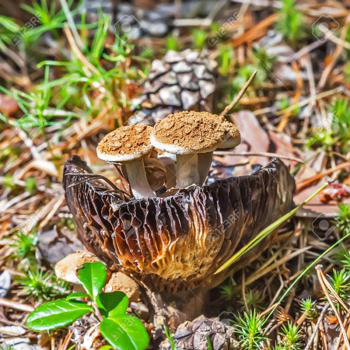

In [328]:
image_look()

We effectively reduced the size of the files from **50 GB to 10 GB** by re-sizing the pictures in the process

### **2.4** Re-format pictures

We should try to be consistent and have all figures in the same format. Right now most of them are **jpeg**. Lets convert **.png, .jpg and .gif to jpeg**

In [137]:
list_species_paths = glob.glob('Clean_Final_DataSet/*')

In [ ]:
# extentions GIF, gif, jpg, JPG, JPEG, PNG, png, pdf, bpm

In [182]:
for path in list_species_paths:
    for filename in os.listdir(path):
        infilename = os.path.join(path,filename)
        if not os.path.isfile(infilename): continue
        oldbase = os.path.splitext(filename)
        newname = infilename.replace('.png', '.jpeg') # adding an extension that guarantees uniqueness
        output = os.rename(infilename, newname)

In [184]:
## checking which paths are not .jpeg

for path in list_species_paths:
    for filename in os.listdir(path):
        if ".jpeg" not in filename:
            print(path)
            print(filename)

In [185]:
# have all the files the same extension?
len(glob.glob('Clean_Final_DataSet/*/*')) == len(glob.glob('Clean_Final_DataSet/*/*.jpeg'))

True

In [183]:
len(glob.glob('Clean_Final_DataSet/*/*.jpeg'))

155161

### **2.5** Create a df to inspec the number of pictures obtained for each mushroom

In [127]:
list_labels = list((pd.Series(glob.glob('Clean_Final_DataSet/*')).str.split("\\", expand=True)[1]))

In [128]:
list_of_lists = []
for name in (list_labels):
    paths = glob.glob('Clean_Final_DataSet/{}/*'.format(name))
    list_of_lists.append(paths)

Since both list follow the same order, we can simply use dict and zip to create the dictionary from the two lists

In [129]:
dict_mushrooms = dict(zip(list_labels, list_of_lists))

Next, I will inspec the number of pictures obtained for each mushroom

In [130]:
number_pictures = []
for i in list_labels:
    number_pictures.append(len(dict_mushrooms[i]))

In [131]:
df_number_pics = pd.DataFrame(list_labels, number_pictures).reset_index()

In [132]:
df_number_pics.columns = ["number_pics", "names"]

In [133]:
df_number_pics.sort_values(by="number_pics", inplace=True)

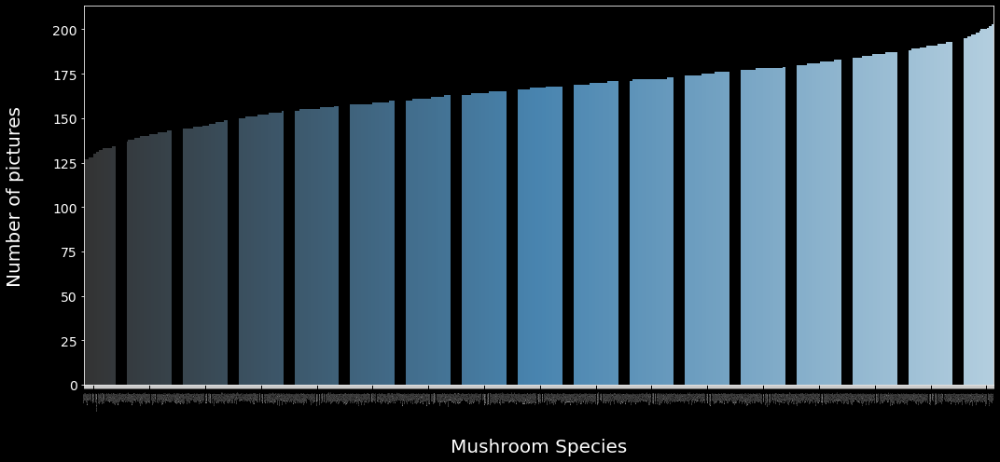

In [135]:
plt.style.use("dark_background")
plt.rcParams["figure.figsize"] = (15,7)
sns.barplot(x=df_number_pics["names"],y=df_number_pics["number_pics"], data=df_number_pics, palette="Blues_d")
plt.ylabel("Number of pictures", fontsize=20, labelpad=30)
plt.xlabel("Mushroom Species", fontsize=20, labelpad=30)
plt.xticks(rotation=90, fontsize=0)
plt.yticks(rotation=0, fontsize=14)
plt.tight_layout()
plt.savefig("figures/number_pictures_2.png", dpi=400)
plt.show()

* Lets also create a label dict to assign to each mushroom type a number

In [136]:
len(list_labels)

959

In [46]:
mush_labels_dict = dict(zip(list_labels, list(range(len(list_labels)))))

In [7]:
# we can use PIL to quickly inspect elements.
def image_inspector(mushroom):
    if mushroom in list_labels:
        return PIL.Image.open(dict_mushrooms[mushroom][random.randint(0,399)]) # picking a picture at random
    else:
        print("Could not find this mushroom")

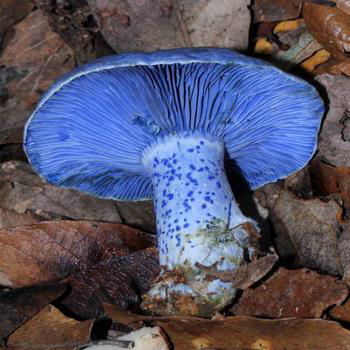

In [357]:
image_inspector("Lactarius_indigo")

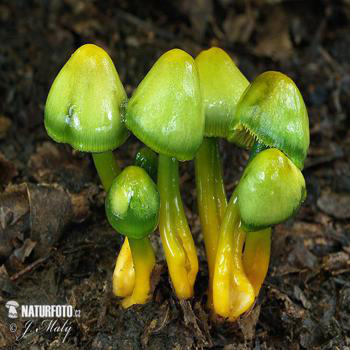

In [30]:
image_inspector("Gliophorus_psittacinus")

### **2.6** Reorganizing data folder structure 

Since this is a large picture dataset we should Organize **train, test, and validation** image datasets into a consistent directory structure. I will use the [splitfolders library](https://pypi.org/project/split-folders/) for this.

    ├── test
    │   ├── mushroom_name
    │   │   └── name_01.jpg
    │   └── ...
    │       └── name_n.jpg
    ├── train
    │   ├── mushroom_name
    │   │   └── name_01.jpg
    │   └── ...
    │       └── name_n.jpg
    └── validation
        ├── mushroom_name
        │   └── name_01.jpg
        └── ...
            └── name_n.jpg


In [ ]:
try:
    splitfolders.ratio("Clean_Final_DataSet_original", output="data_organized", seed=42, ratio=(0.8, 0.15, 0.05)) 
except OSError:
    pass

Copying files: 149936 files [28:00, 91.16 files/s] 

## 3. Testing data Augmentation
* Let's test the effects of data augmentation on one of the pictures

In [11]:
img_size = 299
image_path = "data_organized/train/Rhodotus_palmatus/Rhodotus palmatus_3.jpeg"

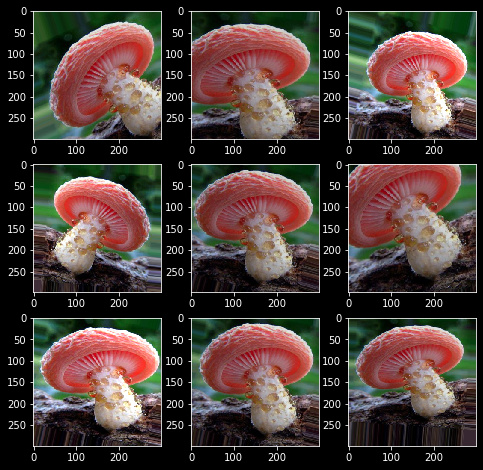

In [9]:
# load the image
img = image.load_img(str(image_path), target_size = (img_size,img_size)) 
# convert to numpy array
data = image.img_to_array(img)
# expand dimension to one sample
samples = np.expand_dims(data, 0)
# create image data augmentation generator
datagen = ImageDataGenerator(
        rotation_range=30, # value from 0 to 180 rotation
        width_shift_range=0.1,  # moving the pictures a fraction of the width (movement left right)
        height_shift_range=0.1,   # moving the pictures a fraction of teh height (movement up down) 
        brightness_range=[0.8, 1.2],
        shear_range=0.1,   # random cuts 
        zoom_range=0.25,   # in/out random zoom     
        horizontal_flip=True,   # flipping pictures horizontally. This could be for facial recognition. 
        fill_mode='nearest') # a strategy to fill in the pixels that we removed from the previous changes
# prepare iterator
it = datagen.flow(samples, batch_size=1)

plt.style.use("dark_background")
plt.rcParams["figure.figsize"] = (8,8)
# generate samples and plot
for i in range(9):
	# define subplot
	plt.subplot(330 + 1 + i)
	# generate batch of images
	batch = it.next()
	# convert to unsigned integers for viewing
	imag = batch[0].astype('uint8')
	# plot raw pixel data
	plt.imshow(imag)
# show the figure
plt.show()

I selected Xception for transfer learning, a model with reduced complexity which gives good results on the **ImageNet** dataset. See this [paper](https://arxiv.org/abs/1810.00736) for model performance comparission. 

## 4. Select CNN models for transfer learning

Three different models, reported to have high accuracy, were selected for transfer learning. See this [paper](https://arxiv.org/abs/1810.00736) for model performance comparission. 

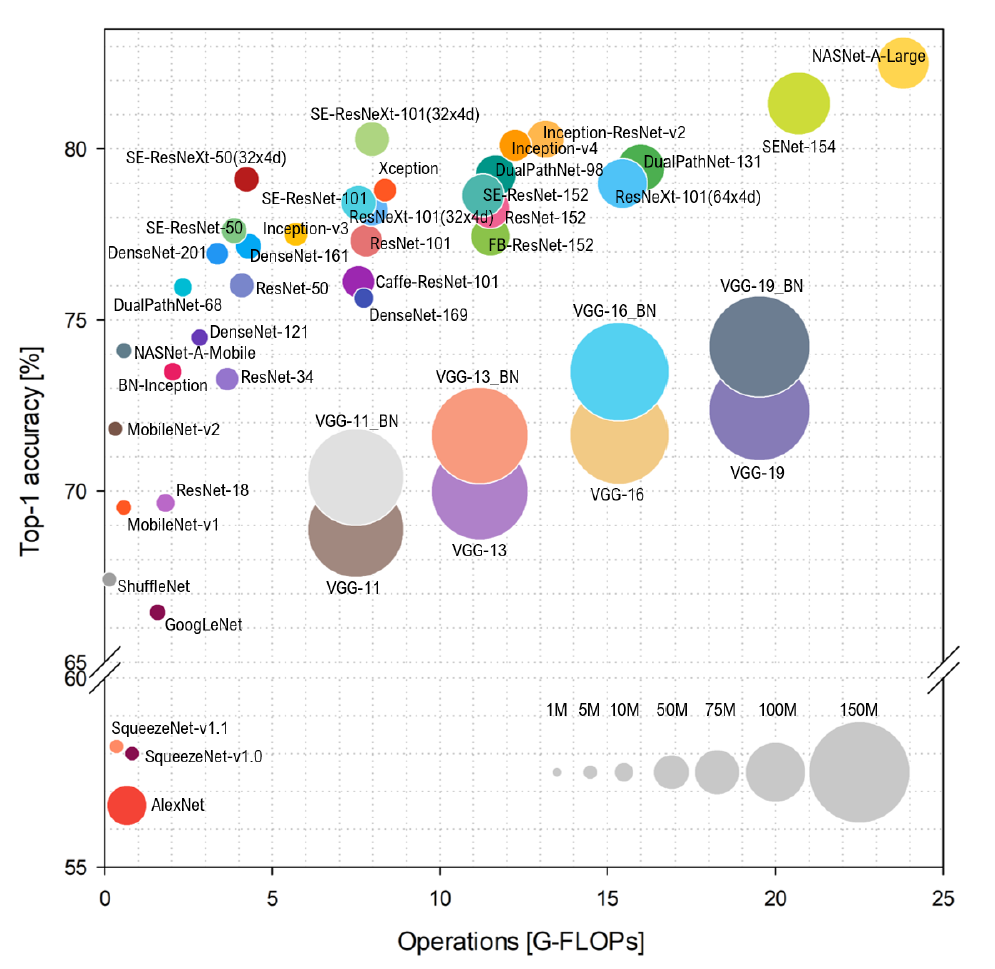

In [1]:
import PIL # image library tool

PIL.Image.open(r".\figures\image_classification_models.png")

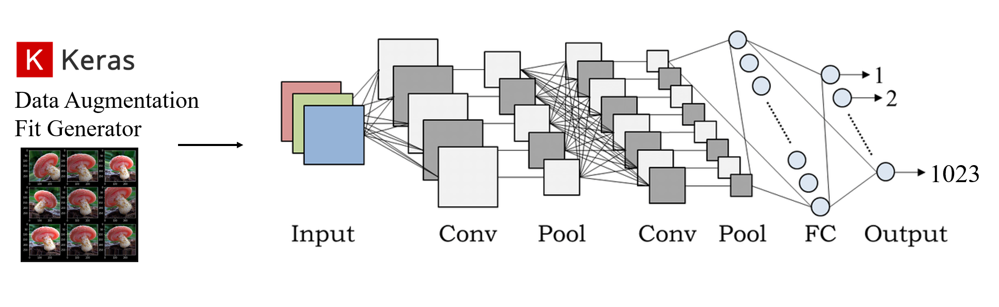

In [5]:
import PIL # image library tool

PIL.Image.open(r"./figures/CNN_architecture.png")

## 5. ImageDataGenerator_*Xception*

* We will use the ImageDataGenerator class to progressively load the images for our picture dataset.
* Note: In this particular problem I will use categorical_crossentropy since our classes are not mutually exclusive, i.e. we care about close enough predictions. [See difference with sparse here](https://stackoverflow.com/questions/58565394/what-is-the-difference-between-sparse-categorical-crossentropy-and-categorical-c)

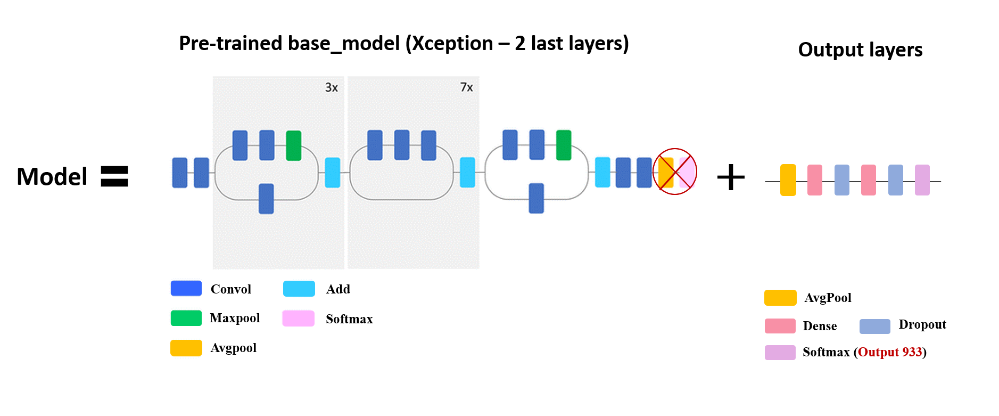

In [6]:
import PIL # image library tool

PIL.Image.open(r"./figures/Xception_structure.png")

In [14]:
#Create training data generator
train_datagen = ImageDataGenerator(
        preprocessing_function=tf.keras.applications.xception.preprocess_input,
        rotation_range=40, # value from 0 to 180 rotation
        width_shift_range=0.1,  # moving the pictures a fraction of the width (movement left right)
        height_shift_range=0.1,   # moving the pictures a fraction of teh height (movement up down) 
        brightness_range=[0.8,1.2],
        shear_range=0.2,   # random cuts 
        zoom_range=0.2,   # in/out random zoom     
        horizontal_flip=True,   # flipping pictures horizontally. This could be for facial recognition. 
        fill_mode='nearest') # a strategy to fill in the pixels that we removed from the previous changes

train_generator = train_datagen.flow_from_directory(
        'data_organized/train/', #directory that contains training data
        target_size=(img_size, img_size), #what size image we want
        batch_size=16, #how many files to read in at a time
        class_mode="categorical")

Found 122774 images belonging to 933 classes.


In [12]:
# Create validation data generator

val_datagen = ImageDataGenerator(preprocessing_function=tf.keras.applications.xception.preprocess_input)

val_generator = val_datagen.flow_from_directory(
        'data_organized/val/',
        target_size=(img_size, img_size),
        batch_size=16,
        class_mode="categorical")


Found 22658 images belonging to 933 classes.


In [13]:
#Create test data generator

test_datagen = ImageDataGenerator(preprocessing_function=tf.keras.applications.xception.preprocess_input)

test_generator = test_datagen.flow_from_directory(
        'data_organized/test/',
        target_size=(img_size, img_size),
        batch_size=1,
        class_mode="categorical",
        shuffle=False)

Found 8495 images belonging to 933 classes.


* Once the iterators have been prepared, we can use them when fitting and evaluating a deep learning model.

## 6. Create the CNN architecture and train the model - 1st. *[Xception (2016)](https://keras.io/api/applications/xception/)*
**Trainable params: 27,946,080**

* I will start testing the **Xception model** for transfer learning.

Next let’s load an Xception model, pretrained on ImageNet. 

We will exclude the top of the network by setting include_top=False: **this excludes the
global average pooling layer and the dense output layer**. 


In [36]:
base_model_xception = keras.applications.Xception(weights='imagenet', input_shape=(299, 299, 3), include_top=False) 

Next we freeze the xception layers 

In [37]:
# 2) Freeze

# The base model contains batchnorm layers. We want to keep them in inference mode
# when we unfreeze the base model for fine-tuning, so we make sure that the
# base_model is running in inference mode here. 👀

base_model_xception.trainable = False

We then add our own global average pooling layer, based on the output of the base model, followed by a dense output layer with one unit per class, using the softmax activation function. Finally, we create the Keras Model:

In [38]:

x = base_model_xception.output
x = keras.layers.GlobalAveragePooling2D()(x) # 
x = keras.layers.Dense(2048, activation="relu")(x)
x = keras.layers.Dropout(0.5)(x)  # Regularize with dropout
x = keras.layers.Dense(1024, activation="relu")(x)
x = keras.layers.Dropout(0.2)(x)  # Regularize with dropout

predictions = keras.layers.Dense(824, activation="softmax")(x)

model_xception = keras.Model(inputs=base_model_xception.input, outputs=predictions)

model_xception.summary()


Model: "functional_9"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            [(None, 299, 299, 3) 0                                            
__________________________________________________________________________________________________
block1_conv1 (Conv2D)           (None, 149, 149, 32) 864         input_2[0][0]                    
__________________________________________________________________________________________________
block1_conv1_bn (BatchNormaliza (None, 149, 149, 32) 128         block1_conv1[0][0]               
__________________________________________________________________________________________________
block1_conv1_act (Activation)   (None, 149, 149, 32) 0           block1_conv1_bn[0][0]            
_______________________________________________________________________________________

In [39]:
early_stopping_cb = keras.callbacks.EarlyStopping(patience=5)
checkpoint_cb = keras.callbacks.ModelCheckpoint("my_mushroom_model_xception.h5", save_best_only=True)

In [ ]:
# 1) No train any of the Xception layers -> Allow a first round of epocs 
base_model_xception.trainable = False


# 2) During the second round of epocs we can train all the xception layers

# Unfreeze the base_model. Note that it keeps running in inference mode
# since we passed `training=False` when calling it. This means that
# the batchnorm layers will not update their batch statistics.
# This prevents the batchnorm layers from undoing all the training
# we've done so far.
#base_model.trainable = True



learning_rate=0.001 # 0.0001, 0.00001

model_xception.compile(loss="categorical_crossentropy", # labels = one-hot-encoded
              optimizer=keras.optimizers.Adam(lr=learning_rate, decay=learning_rate/10), # 0.0001 for second round, # 0.00001 for third round
              metrics=["categorical_accuracy"])


fit_history_xception = model_xception.fit(
        train_generator, #train data generator 
        steps_per_epoch=len(train_generator)//16,
        epochs=5,
        validation_data=val_generator, #validation data generator 
        validation_steps=len(val_generator)//16,
        callbacks=[early_stopping_cb, checkpoint_cb])

In [2]:
epocs = list(range(1,98))
loss_train = [6.7474, 5.1731, 5.0574, 4.9309, 4.9059, 4.8780, 4.7856, 4.7535, 4.6697, 4.8095, 4.4703, 4.2654, 4.0980, 3.9375, 3.8099, 3.7142, 3.6110, 3.4622, 3.4121, 3.2876, 3.2186, 3.1327, 3.0217, 2.9710, 2.8422, 2.7915, 2.7266, 2.7556, 2.7140, 2.6352, 2.6846, 2.5760, 2.5942, 2.4981, 2.4216, 2.4000, 2.3488, 2.3199, 2.2548, 2.2000, 2.1622, 2.1423, 2.1018, 1.9866, 1.8692, 1.8186, 1.8144, 1.7570, 1.7642, 1.6871, 1.7368, 1.6563, 1.6651, 1.6649, 1.6503, 1.6196, 1.6398, 1.6398, 1.6240, 1.5872, 1.5819, 1.5717, 1.5714, 1.5584, 1.5215, 1.5226, 1.5222, 1.5176, 1.4988, 1.5445, 1.4868, 1.4791, 1.4811, 1.4623, 1.4323, 1.4471, 1.4143, 1.4654, 1.4243, 1.4141, 1.4078, 1.3963, 1.3928, 1.3675, 1.3526, 1.3578, 1.3527, 1.3626, 1.3621, 1.3407, 1.3287, 1.2915, 1.3077, 1.2858, 1.2741, 1.3019, 1.2786 ]
accuracy_train = [0.0914, 0.1069, 0.1029, 0.1115, 0.1036, 0.1064, 0.1121, 0.1142, 0.1249, 0.1175, 0.1248, 0.1353, 0.1453, 0.1635, 0.1692, 0.1807, 0.1895, 0.2067, 0.2117, 0.2314, 0.2392, 0.2544, 0.2655, 0.2771, 0.2917, 0.3036, 0.3143, 0.3104, 0.3207, 0.3233, 0.3199, 0.3345, 0.3326, 0.3470, 0.3603, 0.3712, 0.3785, 0.3758, 0.4001, 0.4018, 0.4090, 0.4164, 0.4203, 0.4404, 0.4659, 0.4697, 0.4680, 0.4871, 0.4859, 0.4976, 0.4888, 0.5058, 0.5046, 0.5007, 0.5005, 0.5096, 0.5048, 0.5082, 0.5067, 0.5240, 0.5160, 0.5185, 0.5150, 0.5205, 0.5277, 0.5279, 0.5263, 0.5298, 0.5338, 0.5228, 0.5353, 0.5371, 0.5366, 0.5371, 0.5428, 0.5463, 0.5447, 0.5381, 0.5549, 0.5480, 0.5549, 0.5625, 0.5551, 0.5658, 0.5695, 0.5606, 0.5633, 0.5697, 0.5593, 0.5714, 0.5749, 0.5829, 0.5772, 0.5787, 0.5853, 0.5727, 0.5836] 
loss_val = [6.7494, 5.0354, 4.9459, 4.8920, 4.8036, 4.7642, 4.6771, 4.6946, 4.5846, 4.2679, 4.2405, 3.9921, 3.8084, 3.6321, 3.5676, 3.4030, 3.2273, 3.2457, 3.0018, 3.0519, 2.9986, 2.8850, 2.6721, 2.6849, 2.6615, 2.4813, 2.5089, 2.4805, 2.3091, 2.3761, 2.3211, 2.3051, 2.2151, 2.1793, 2.1497, 2.0253, 2.0121, 1.9498, 1.9254, 1.9593, 1.9178, 1.8180, 1.7854, 1.6607, 1.5643, 1.5865, 1.4882, 1.5173, 1.5388, 1.5303, 1.4681, 1.4510, 1.4146, 1.4216, 1.4501, 1.3675, 1.3624, 1.2785, 1.4479, 1.2764, 1.3549, 1.3220, 1.3843, 1.2710, 1.2812, 1.2833, 1.2439, 1.2667, 1.2512, 1.2148, 1.2003, 1.1579, 1.1872, 1.1662, 1.1610, 1.1564, 1.1641, 1.0987, 1.1824, 1.1210, 1.0875, 1.1698, 1.0489, 1.1476, 1.0667, 1.0233, 1.029, 1.0205, 1.0604, 1.0501, 1.0714, 0.9858, 1.0368, 1.0653, 1.0489, 1.0295, 1.0386]
accuracy_val = [0.0023, 0.0411, 0.0411, 0.0380, 0.0563, 0.0403, 0.0501, 0.0625, 0.0773, 0.0761, 0.0947, 0.1277, 0.1366, 0.1696, 0.1825, 0.2143, 0.2283, 0.2337, 0.2721, 0.2710, 0.2714, 0.3078, 0.3125, 0.3397, 0.3474, 0.3800, 0.3548, 0.3812, 0.4138, 0.4026, 0.4165, 0.4119, 0.4239, 0.4301, 0.4325, 0.4701, 0.4786, 0.4818, 0.5027, 0.4713, 0.4903, 0.5136, 0.5280, 0.5466, 0.5691, 0.5699, 0.5835, 0.5734, 0.5730, 0.5873, 0.6048, 0.5951, 0.5998, 0.6126, 0.6002, 0.6161, 0.6176, 0.6130, 0.5994, 0.6460, 0.6188, 0.6277, 0.6242, 0.6405, 0.6456, 0.6355, 0.6409, 0.6537, 0.6467, 0.6460, 0.6530, 0.6588, 0.6731, 0.6669, 0.6592, 0.6681, 0.6564, 0.6720, 0.6755, 0.6817, 0.6700, 0.6650, 0.6755, 0.6828, 0.6786, 0.7007, 0.6914, 0.6960, 0.6832, 0.6805, 0.6941, 0.7034, 0.6925, 0.6960, 0.6941, 0.6968, 0.6902]  

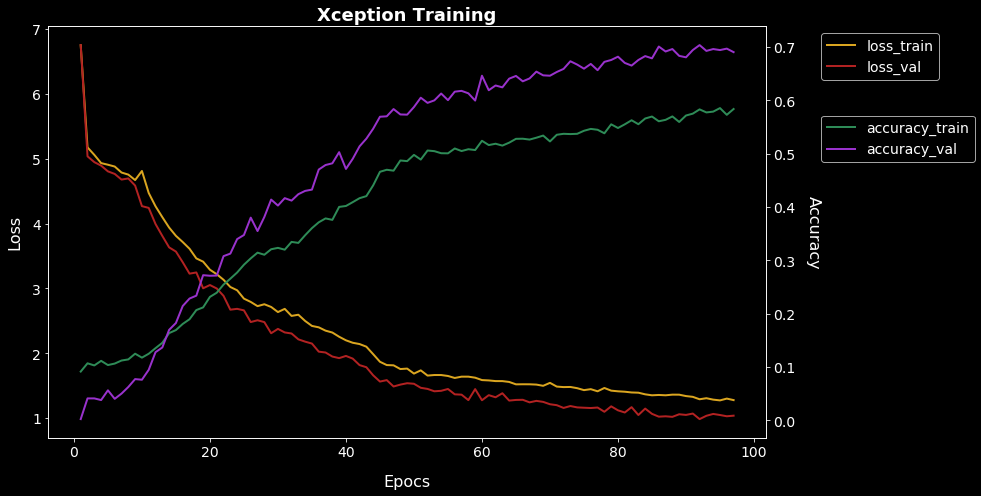

In [4]:
plt.rcParams["figure.figsize"] = (14,7)
plt.style.use("dark_background")

plt.plot(epocs, loss_train, markersize=3, linewidth=2, linestyle='-', color= "goldenrod")
plt.plot(epocs, loss_val, markersize=3, linewidth=2, linestyle='-', color= "firebrick")

plt.legend(["loss_train", "loss_val"], scatterpoints=1, loc= "upper right", fontsize=14,  ncol=1, bbox_to_anchor=(1.25, 1))
plt.title("Xception Training", fontsize=18, fontweight='bold')

plt.xticks(fontsize=14)
plt.xlabel("Epocs", labelpad=15, fontsize=16)

plt.yticks(rotation="horizontal", fontsize=14)
plt.ylabel("Loss", labelpad=10, fontsize=16)

ax2 = plt.twinx() 
ax2.plot(epocs, accuracy_train, "-", linewidth=2, color="seagreen")
ax2.plot(epocs, accuracy_val, "-", linewidth=2, color="darkorchid")
ax2.set_ylabel('Accuracy', rotation=270, labelpad=25, fontsize=16)
ax2.legend(["accuracy_train", "accuracy_val"], scatterpoints=1, loc= "best", fontsize=14,  ncol=1, bbox_to_anchor=(1.3, 0.8))
ax2.set_yticklabels([round(num, 1) for num in list(np.arange(-0.1, 1, 0.1))],fontsize=14)

plt.tight_layout()

plt.savefig("figures/Xception_Training.png", dpi=300, bbox_inches="tight")

plt.show()

We observe a better performance on the validation set compared to the training set. A possible explanation is that the validation set may be easier than the training set. [See this article](https://www.pyimagesearch.com/2019/10/14/why-is-my-validation-loss-lower-than-my-training-loss/). Indeed, data augmentation is only applied on the train set, and after inspecting the picture set obtained from google images, I observed pictures duplicated in both sets. So next I will perform some data cleaning by removing duplicate pictures. This will reduce the dataset size but the model will generalize better. Nonetheless, lets evaluate the model performance first.

**Model Evaluation**

In [29]:
model = keras.models.load_model("my_mushroom_model_xception.h5")

In [9]:
list_classes = list(pd.Series(glob.glob('Clean_Final_DataSet/*')).str.split("\\", expand=True)[1].str.replace("_", " "))

In [55]:
imgs, labels = next(val_generator)

In [56]:
# use this function to plot pictures from 1 x batch data


def plotImages(images_arr):
    fig, axes = plt.subplots(1, 10, figsize=(20,5))
    axes = axes.flatten()
    for img, ax in zip( images_arr, axes):
        ax.imshow(img)
        ax.axis('off')
    plt.tight_layout()
    plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

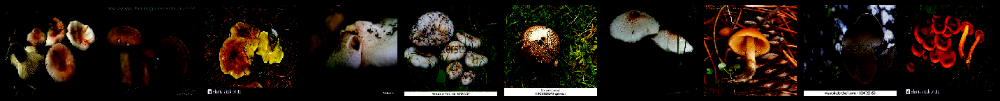

In [57]:
plotImages(imgs)

In [59]:
test_imgs, test_labels = next(test_generator)

In [60]:
test_generator.classes # the appear ordered bcos we specified shuffle=False when defining the test_generator

array([  0,   0,   0, ..., 822, 822, 822])

In [ ]:
predictions=model.predict(x=test_generator, verbose=0)

In [ ]:
loss, acc = model.evaluate(x=test_generator, verbose=0)
print("Final model -> accuracy: {:5.2f}%, loss: {:5.2f}".format(100*acc, loss)) 

Final model -> **accuracy: 70.30%**, loss:  1.02

In [ ]:
np.round(predictions)

In [124]:
list_classes = list(pd.read_csv("final_mush_824.csv").sort_values(by="name").name)

In [189]:
len(list_classes) == len(predictions_niscalo[0])

True

In [ ]:

plot_confusion_matrix(cm=cm, classes=list_classes, title='Confusion Matrix')

**Check Performance for single pictures**

In [16]:
example_paths = glob.glob('Example_pictures/*')

In [30]:
for path in example_paths:
    img = PIL.Image.open(path)
    img = img.resize((299,299))
    img.save(path)


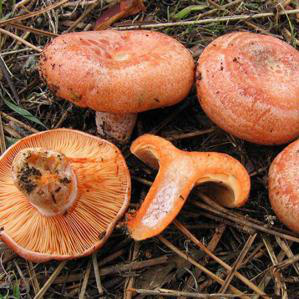

In [157]:
PIL.Image.open(r"E:\Projects\Github_mushroom_project\Example_pictures_xception_1\niscalos.jpeg")

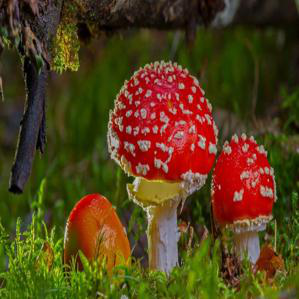

In [159]:
PIL.Image.open(r"E:\Projects\Github_mushroom_project\Example_pictures_xception_1\nomo.jpeg")

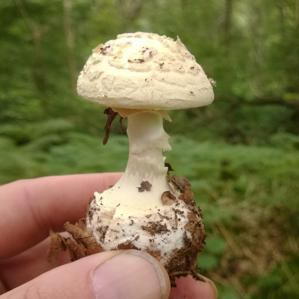

In [165]:
PIL.Image.open(r"E:\Projects\Github_mushroom_project\Example_pictures_xception_1\death_cap.jpeg")

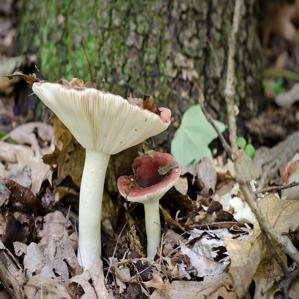

In [168]:
PIL.Image.open(r"E:\Projects\Github_mushroom_project\Example_pictures_xception_1\Russula_cystidiosa.jpeg")

In [31]:

def prepare_image(file):
    img_path = 'Example_pictures_xception_1/'
    img = image.load_img(img_path + file, target_size=(299, 299))
    img_array = image.img_to_array(img)
    img_array_expanded_dims = np.expand_dims(img_array, axis=0)
    return tf.keras.applications.xception.preprocess_input(img_array_expanded_dims)

In [32]:
preprocessed_image_niscalo = prepare_image('lactarius_delicious.jpeg')
predictions_niscalo = model.predict(preprocessed_image_niscalo)

preprocessed_image_nomo = prepare_image('amanita_muscaria.jpeg')
predictions_nomo = model.predict(preprocessed_image_nomo)

preprocessed_image_russula = prepare_image('Russula_cystidiosa.jpeg')
predictions_russula = model.predict(preprocessed_image_russula)


In [246]:
preprocessed_image_carmelius_1 = prepare_image('carmelius_1.jpeg')
predictions_carmelius_1 = model.predict(preprocessed_image_carmelius_1)

preprocessed_image_carmelius_2 = prepare_image('carmelius_2.jpeg')
predictions_carmelius_2 = model.predict(preprocessed_image_carmelius_2)

preprocessed_image_carmelius_3 = prepare_image('carmelius_3.jpeg')
predictions_carmelius_3 = model.predict(preprocessed_image_carmelius_3)

preprocessed_image_carmelius_4 = prepare_image('carmelius_4.jpeg')
predictions_carmelius_4 = model.predict(preprocessed_image_carmelius_4)

preprocessed_image_carmelius_5 = prepare_image('carmelius_5.jpeg')
predictions_carmelius_5 = model.predict(preprocessed_image_carmelius_5)

In [26]:

def top_5_predictions(array, class_list):
    
    """function to retrieve the top 5 predictions """
    
    inx = array[0].argsort()[-5:][::-1] # getting the indexes of the top 5 predictions in descending order
    
    top_1 = array[0][inx[0]]*100
    top_2 = array[0][inx[1]]*100
    top_3 = array[0][inx[2]]*100
    top_4 = array[0][inx[3]]*100
    top_5 = array[0][inx[4]]*100
    
    class_1 = class_list[inx[0]]
    class_2 = class_list[inx[1]]
    class_3 = class_list[inx[2]]
    class_4 = class_list[inx[3]]
    class_5 = class_list[inx[4]]
    
    return print("Top 1 Prediction: With {:4.1f}% probability is a picture of {}.\nTop 2 Prediction: With {:4.1f}% probability is a picture of {}.\nTop 3 Prediction: With {:4.1f}% probability is a picture of {}.\nTop 4 Prediction: With {:4.1f}% probability is a picture of {}.\nTop 5 Prediction: With {:4.1f}% probability is a picture of {}."
                 .format(top_1, class_1, top_2, class_2, top_3, class_3, top_4, class_4, top_5, class_5))

In [33]:
top_5_predictions(predictions_niscalo, list_classes) # we can see that our model has a very confident solution for this example

Top 1 Prediction: With 84.6% probability is a picture of Hydnellum spongiosipes.
Top 2 Prediction: With  6.4% probability is a picture of Hygrocybe laeta.
Top 3 Prediction: With  3.1% probability is a picture of Hygrocybe intermedia.
Top 4 Prediction: With  2.9% probability is a picture of Hygrocybe flavescens.
Top 5 Prediction: With  2.2% probability is a picture of Hydnellum caeruleum.


In [34]:
top_5_predictions(predictions_nomo, list_classes) 

Top 1 Prediction: With 32.6% probability is a picture of Amanita regalis.
Top 2 Prediction: With 22.9% probability is a picture of Amanita ponderosa.
Top 3 Prediction: With 12.6% probability is a picture of Amanita phalloides.
Top 4 Prediction: With  5.1% probability is a picture of Baeospora myosura.
Top 5 Prediction: With  4.6% probability is a picture of Amanita torrendii.


In [203]:
top_5_predictions(predictions_death, list_classes) 

Top 1 Prediction: With 64.2% probability is a picture of Amanita citrina.
Top 2 Prediction: With 15.7% probability is a picture of Amanita citrina var citrina.
Top 3 Prediction: With  4.9% probability is a picture of Amanita strobiliformis.
Top 4 Prediction: With  4.9% probability is a picture of Amanita citrina var alba.
Top 5 Prediction: With  3.0% probability is a picture of Amanita gioiosa.


In [204]:
top_5_predictions(predictions_russula, list_classes) 

Top 1 Prediction: With 91.6% probability is a picture of Russula atropurpurea.
Top 2 Prediction: With  2.6% probability is a picture of Russula sardonia.
Top 3 Prediction: With  1.5% probability is a picture of Russula caerulea.
Top 4 Prediction: With  1.4% probability is a picture of Russula viscida.
Top 5 Prediction: With  1.2% probability is a picture of Russula.


In [247]:
top_5_predictions(predictions_carmelius_1, list_classes) 

Top 1 Prediction: With 83.1% probability is a picture of Lactarius deliciosus.
Top 2 Prediction: With  4.6% probability is a picture of Lactarius.
Top 3 Prediction: With  4.0% probability is a picture of Lactarius salmonicolor.
Top 4 Prediction: With  2.1% probability is a picture of Lactarius quieticolor.
Top 5 Prediction: With  1.8% probability is a picture of Lactarius semisanguifluus.


In [248]:
top_5_predictions(predictions_carmelius_2, list_classes) 

Top 1 Prediction: With 35.8% probability is a picture of Amanita gioiosa.
Top 2 Prediction: With 32.4% probability is a picture of Amanita gemmata.
Top 3 Prediction: With  6.5% probability is a picture of Amanita pseudoregalis.
Top 4 Prediction: With  4.0% probability is a picture of Amanita breckonii.
Top 5 Prediction: With  2.9% probability is a picture of Amanita eliae.


In [249]:
top_5_predictions(predictions_carmelius_3, list_classes) 

Top 1 Prediction: With 83.6% probability is a picture of Turbinellus kauffmanii.
Top 2 Prediction: With  7.5% probability is a picture of Turbinellus floccosus.
Top 3 Prediction: With  4.2% probability is a picture of Clavariadelphus truncatus.
Top 4 Prediction: With  0.8% probability is a picture of Clavariadelphus pistillaris.
Top 5 Prediction: With  0.8% probability is a picture of Helvella crispa.


In [250]:
top_5_predictions(predictions_carmelius_4, list_classes) 

Top 1 Prediction: With 53.4% probability is a picture of Clitocybe nuda.
Top 2 Prediction: With 42.7% probability is a picture of Lepista nuda.
Top 3 Prediction: With  3.1% probability is a picture of Lepista personata.
Top 4 Prediction: With  0.7% probability is a picture of Lepista saeva.
Top 5 Prediction: With  0.0% probability is a picture of Lactarius violascens.


In [252]:
top_5_predictions(predictions_carmelius_5, list_classes) 

Top 1 Prediction: With 73.3% probability is a picture of Clitocybe nuda.
Top 2 Prediction: With 18.3% probability is a picture of Lepista nuda.
Top 3 Prediction: With  8.3% probability is a picture of Lepista personata.
Top 4 Prediction: With  0.1% probability is a picture of Lepista saeva.
Top 5 Prediction: With  0.0% probability is a picture of Cortinarius purpurascens.


## 7. ImageDataGenerator_*[EfficientNetB7 (2020)](https://keras.io/api/applications/efficientnet/#efficientnetb7-function)*

EfficientNets rely on AutoML and compound scaling to achieve superior performance without compromising resource efficiency. The AutoML Mobile framework has helped develop a mobile-size baseline network, EfficientNet-B0, which is then improved by the compound scaling method to obtain EfficientNet-B1 to B7.

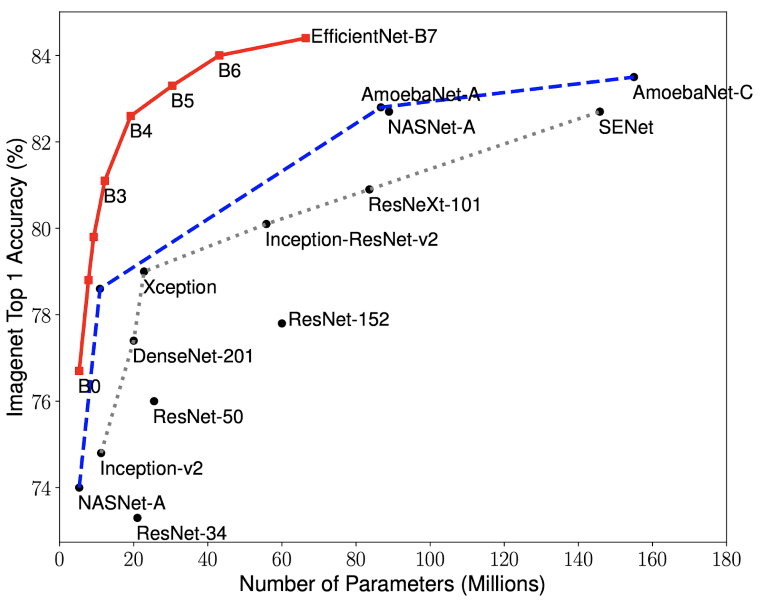

In [4]:
import PIL # image library tool

PIL.Image.open(r"./figures/efficientnetB7_google.png")

In [ ]:
#Create training data generator
train_datagen = ImageDataGenerator(
        preprocessing_function=tf.keras.applications.efficientnet.preprocess_input,
        rotation_range=35, # value from 0 to 180 rotation
        width_shift_range=0.1,  # moving the pictures a fraction of the width (movement left right)
        height_shift_range=0.1,   # moving the pictures a fraction of teh height (movement up down) 
        brightness_range=[0.8,1.2],
        shear_range=0.05,   # random cuts 
        zoom_range=0.2,   # in/out random zoom     
        horizontal_flip=True,   # flipping pictures horizontally. This could be for facial recognition. 
        fill_mode='nearest') # a strategy to fill in the pixels that we removed from the previous changes

train_generator = train_datagen.flow_from_directory(
        'data_organized_reduced/train/', #directory that contains training data
        target_size=(img_size, img_size), #what size image we want
        batch_size=8, #how many files to read in at a time
        class_mode="categorical")

In [ ]:
# Create validation data generator

val_datagen = ImageDataGenerator(preprocessing_function=tf.keras.applications.efficientnet.preprocess_input)

val_generator = val_datagen.flow_from_directory(
        'data_organized_reduced/val/',
        target_size=(img_size, img_size),
        batch_size=8,
        class_mode="categorical")


In [ ]:
#Create validation test generator

test_datagen = ImageDataGenerator(preprocessing_function=tf.keras.applications.efficientnet.preprocess_input)

test_generator = test_datagen.flow_from_directory(
        'data_organized/test/',
        target_size=(img_size, img_size),
        batch_size=1,
        class_mode="categorical",
        shuffle=False)

Found 5339 images belonging to 814 classes.

## 8. Create the CNN architecture and train the model. *[EfficientNetB7 (2020)](https://keras.io/api/applications/efficientnet/#efficientnetb7-function)*

In [ ]:
base_model = keras.applications.EfficientNetB7(weights='imagenet', 
                                                  input_shape=(img_size, img_size, 3),
                                                  include_top=False) 

In [ ]:
# Freeze layers

# The base model contains batchnorm layers. We want to keep them in inference mode
# when we unfreeze the base model for fine-tuning, so we make sure that the
# base_model is running in inference mode here. 👀

base_model_inception.trainable = False

In [ ]:
x = base_model.output
x = keras.layers.GlobalAveragePooling2D()(x) # 
x = keras.layers.Dense(8192, activation="relu")(x)
x = keras.layers.Dropout(0.5)(x)  # Regularize with dropout
x = keras.layers.Dense(4096, activation="relu")(x)
x = keras.layers.Dropout(0.5)(x)  # Regularize with dropout
x = keras.layers.Dense(4096, activation="relu")(x)
x = keras.layers.Dropout(0.5)(x)  # Regularize with dropout

predictions = keras.layers.Dense(1023, activation="softmax")(x)

model = keras.Model(inputs=base_model.input, outputs=predictions)

model.summary()

In [ ]:
def build_lrfn(lr_start=0.001, lr_max=0.001,lr_min=0.000001, lr_rampup_epochs=5,lr_sustain_epochs=0, lr_exp_decay=.8):
    
    def lrfn(epoch):
        if epoch < lr_rampup_epochs:
            lr = (lr_max - lr_start) / lr_rampup_epochs * epoch + lr_start
        elif epoch < lr_rampup_epochs + lr_sustain_epochs:
            lr = lr_max
        else:
            lr = (lr_max - lr_min) *\
                 lr_exp_decay**(epoch - lr_rampup_epochs- lr_sustain_epochs) + lr_min
        return lr
    return lrfn

In [ ]:
lrfn = build_lrfn()
lr_schedule = tf.keras.callbacks.LearningRateScheduler(lrfn, verbose=1)
early_stopping_cb = keras.callbacks.EarlyStopping(patience=8)
checkpoint_cb = keras.callbacks.ModelCheckpoint("my_mushroom_model_EfficientNetB7.h5", save_best_only=True)

In [ ]:
model.compile(loss="categorical_crossentropy", # labels = one-hot-encoded
              optimizer=keras.optimizers.Adam(), # 0.0001 for second round
              metrics=["categorical_accuracy"])

from PIL import ImageFile
ImageFile.LOAD_TRUNCATED_IMAGES = True # dealing with couple of truncated pictures

EfficientNetB7_mush = model.fit(
        train_generator, #train data generator 
        steps_per_epoch=len(train_generator)//8,
        epochs=100,
        validation_data=val_generator, #validation data generator 
        validation_steps=len(val_generator)//8,
        callbacks=[early_stopping_cb, checkpoint_cb, lr_schedule])

**Interestingly efficientNetB7 did not result in a good model and it took to long to train. Next used again Xception for transfer learning, but this time I used a picture size of 600 x 600 and a batch size of 12**

Possible improvements


* Tougher **filter** of species. Remove pseudo species
* **Avoid** as much **data imbalance** as possible
* Keep the width picture ratio [see this discussion](https://stackoverflow.com/questions/47697622/cnn-image-resizing-vs-padding-keeping-aspect-ratio-or-not/49882055#49882055)
* Instead of squared pictures, we can estimate the **average dimentions (width and height)** in our dataset and use it to keep the mushrooms aspect ratio  
* Further **clean**

See below some of the **hyperparameters** that can be tweake aswell to improve model's performance.


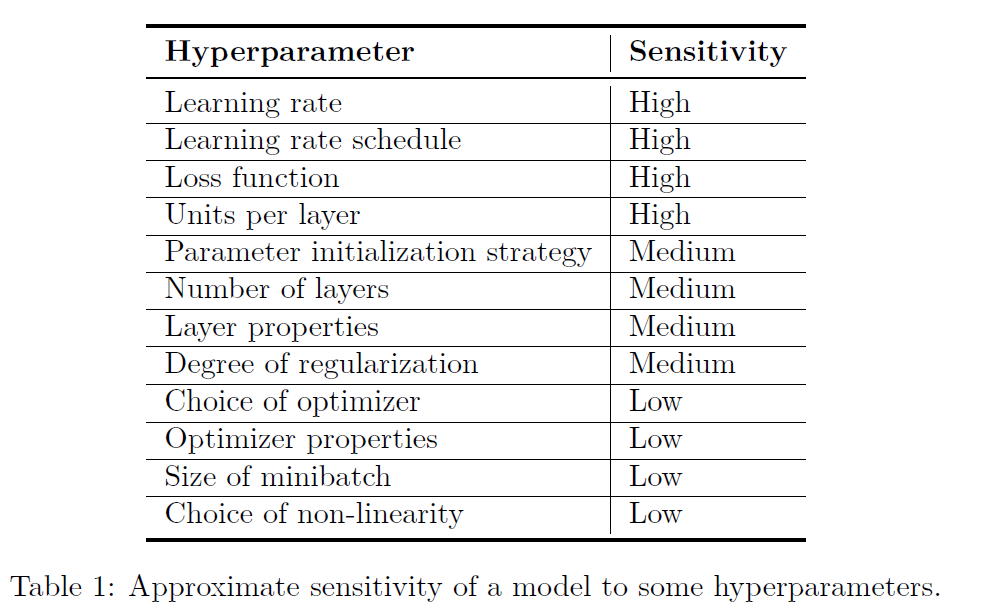

In [8]:
import PIL # image library tool
# Source: Machine Learning Engineering by Andriv Burkov
PIL.Image.open(r"./figures/sensitivity_parameters_NN.png")

In [109]:
df = pd.read_csv("All_names_google_results_copy.csv")

In [110]:
df

,names,len,word1,word2,Results_Google,Number_Hits_Google
0,Agaricus altipes,16,Agaricus,altipes,"Aproximadamente 7.580 resultados (0,42 segundos)",7580
1,Mycena pura,11,Mycena,pura,"Aproximadamente 112.000 resultados (0,34 segun...",112000
2,Tuber rufum,11,Tuber,rufum,"Aproximadamente 35.500 resultados (0,37 segund...",35500
3,Clavariaceae,12,Clavariaceae,NaN,"Aproximadamente 310.000 resultados (0,35 segun...",310000
4,Coryne dubia,12,Coryne,dubia,"Aproximadamente 8.750 resultados (0,38 segundos)",8750
...,...,...,...,...,...,...
1887,Rheubarbariboletus armeniacus,29,Rheubarbariboletus,armeniacus,"Aproximadamente 5.040 resultados (0,40 segundos)",5040
1888,Tolypocladium ophioglossoides,29,Tolypocladium,ophioglossoides,"Aproximadamente 14.800 resultados (0,43 segund...",14800
1889,Gymnosporangium clavariaeforme,30,Gymnosporangium,clavariaeforme,"Aproximadamente 10.100 resultados (0,40 segund...",10100
1890,Callistosporium luteo-olivaceum,31,Callistosporium,luteo-olivaceum,"Aproximadamente 12.500 resultados (0,40 segund...",12500


In [111]:
df.loc[df["Number_Hits_Google"]>20000]

,names,len,word1,word2,Results_Google,Number_Hits_Google
1,Mycena pura,11,Mycena,pura,"Aproximadamente 112.000 resultados (0,34 segun...",112000
2,Tuber rufum,11,Tuber,rufum,"Aproximadamente 35.500 resultados (0,37 segund...",35500
3,Clavariaceae,12,Clavariaceae,NaN,"Aproximadamente 310.000 resultados (0,35 segun...",310000
5,Cyathus olla,12,Cyathus,olla,"Aproximadamente 66.900 resultados (0,63 segund...",66900
6,Exidia plana,12,Exidia,plana,"Aproximadamente 55.100 resultados (0,58 segund...",55100
...,...,...,...,...,...,...
1864,Chlorociboria aeruginascens,27,Chlorociboria,aeruginascens,"Aproximadamente 35.300 resultados (0,33 segund...",35300
1866,Clavariadelphus pistillaris,27,Clavariadelphus,pistillaris,"Aproximadamente 45.500 resultados (0,35 segund...",45500
1873,Porphyrellus porphyrosporus,27,Porphyrellus,porphyrosporus,"Aproximadamente 24.800 resultados (0,51 segund...",24800
1884,Pseudoclitocybe cyathiformis,28,Pseudoclitocybe,cyathiformis,"Aproximadamente 22.000 resultados (0,38 segund...",22000


In [112]:
df_number_pics["names"] = df_number_pics["names"].str.replace("_", " ")

In [113]:
df_number_pics

,number_pics,names
327,91,Dermocybe cinnabarina
464,92,Hygrocybe acuta
331,92,Dermocybe uliginosa
306,93,Crinipellis corticalis
380,97,Galerina perplexa
...,...,...
918,200,Sparassis crispa
221,200,Coprinopsis erythrocephala
79,200,Armillaria mellea
224,201,Coprinus comatus


In [114]:
df_merged = pd.merge(df, df_number_pics, on=["names"])

In [115]:
df_merged.sort_values(by=["Number_Hits_Google", "number_pics", "names"], inplace=True)

In [116]:
df_merged.dtypes

names                 object
len                    int64
word1                 object
word2                 object
Results_Google        object
Number_Hits_Google     int64
number_pics            int64
dtype: object

In [117]:
df_filtered = df_merged.loc[(df_merged["Number_Hits_Google"]>20000)&(df_merged["number_pics"]>125)]

In [118]:
df_filtered.sort_values(by="names", inplace=True)

In [119]:
df_filtered.reset_index(drop=True).head(1000) 

,names,len,word1,word2,Results_Google,Number_Hits_Google,number_pics
0,Abortiporus biennis,19,Abortiporus,biennis,"Aproximadamente 37.100 resultados (0,35 segund...",37100,187
1,Agaricus arvensis,17,Agaricus,arvensis,"Aproximadamente 251.000 resultados (0,37 segun...",251000,192
2,Agaricus augustus,17,Agaricus,augustus,"Aproximadamente 132.000 resultados (0,42 segun...",132000,192
3,Agaricus benesii,16,Agaricus,benesii,"Aproximadamente 95.400 resultados (0,45 segund...",95400,160
4,Agaricus bernardii,18,Agaricus,bernardii,"Aproximadamente 53.900 resultados (0,39 segund...",53900,173
5,Agaricus bitorquis,18,Agaricus,bitorquis,"Aproximadamente 54.000 resultados (0,39 segund...",54000,179
6,Agaricus brunnescens,20,Agaricus,brunnescens,"Aproximadamente 30.900 resultados (0,42 segund...",30900,161
7,Agaricus californicus,21,Agaricus,californicus,"Aproximadamente 50.100 resultados (0,41 segund...",50100,153
8,Agaricus campestris,19,Agaricus,campestris,"Aproximadamente 280.000 resultados (0,40 segun...",280000,192
9,Agaricus excellens,18,Agaricus,excellens,"Aproximadamente 62.600 resultados (0,40 segund...",62600,144


In [120]:
wanted = list(df_filtered["names"])

In [122]:
unwanted = []
for i in df["names"]:
    if i not in wanted:
        unwanted.append(i)
    else:
        pass

In [123]:
unwanted = list(pd.Series(unwanted).str.replace(" ", "_"))

In [126]:
for i in unwanted:
    for j in glob.glob('Clean_Final_DataSet_original/*'):
        if i in j:
            try:
                shutil.rmtree(j)
                print(j)
            except OSError as e:
                print("Error: %s : %s" % (j, e.strerror))
            
        else: 
            pass

Clean_Final_DataSet_original\Russula_rubra
Clean_Final_DataSet_original\Tuber_indicum
Clean_Final_DataSet_original\Amanita_valens
Clean_Final_DataSet_original\Inocybe_pudica
Clean_Final_DataSet_original\Russula_azurea
Clean_Final_DataSet_original\Agaricus_blazei
Clean_Final_DataSet_original\Hebeloma_birrus
Clean_Final_DataSet_original\Hygrocybe_acuta
Clean_Final_DataSet_original\Hygrocybe_ovina
Clean_Final_DataSet_original\Inocybe_friesii
Clean_Final_DataSet_original\Lentinus_edodes
Clean_Final_DataSet_original\Russula_faginea
Clean_Final_DataSet_original\Trogia_venenata
Clean_Final_DataSet_original\Entoloma_albidum
Clean_Final_DataSet_original\Inocybe_queletii
Clean_Final_DataSet_original\Laccaria_affinis
Clean_Final_DataSet_original\Laccaria_montana
Clean_Final_DataSet_original\Lepiota_setulosa
Clean_Final_DataSet_original\Otidea_cochleata
Clean_Final_DataSet_original\Pholiota_flavida
Clean_Final_DataSet_original\Clitocybe_festiva
Clean_Final_DataSet_original\Discina_melaleuca
Clean_

## 9. Create the CNN architecture and train the model - 2nd version using *[Xception (2016)](https://keras.io/api/applications/xception/)*
**Trainable params: 27,946,080**

In [2]:
epocs = list(range(1,189))
loss_train = [6.88, 6.84, 6.81, 6.72, 6.57, 6.51, 6.39, 6.25, 6.07, 6.04, 6.15, 5.64, 5.51, 5.47, 5.39, 5.31, 5.33, 5.3, 5.29, 5.36, 5.28, 5.18, 5.15, 5.04, 5.04, 4.95,4.86, 4.81, 4.81, 4.73, 4.69, 4.67, 4.58, 4.53, 4.48, 4.47, 4.44, 4.38, 4.31, 4.27, 4.27, 4.21, 4.15, 4.14, 4.14, 4.05, 3.99, 3.97, 3.96, 3.89, 3.89, 3.84, 3.83, 3.81, 3.75, 3.76, 3.66, 3.68, 3.64, 3.63, 3.54, 3.51, 3.47, 3.49, 3.44, 3.44, 3.40, 3.39, 3.36, 3.33, 3.35, 3.26, 3.24, 3.27, 3.3, 3.25, 3.20, 3.20, 3.12, 3.08, 3.11, 3.08, 3.02, 3.03, 2.97, 3.03, 2.96, 2.94, 2.96, 2.99, 3, 2.9, 2.94, 2.89, 2.92, 2.94, 2.87, 2.84, 2.81, 2.8, 2.79, 2.79, 2.78, 2.75, 2.75, 2.76, 2.73, 2.72, 2.66, 2.69, 2.64, 2.63, 2.6, 2.63, 2.57, 2.57, 2.51, 2.52, 2.52, 2.5, 2.47, 2.47, 2.47, 2.45, 2.46, 2.45, 2.43, 2.4, 2.42, 2.35, 2.39, 2.37, 2.34, 2.36, 2.31, 2.38, 2.37, 2.38, 2.37, 2.38, 2.37, 2.28, 2.31, 2.31, 2.29, 2.32, 2.26, 2.24, 2.22, 2.25, 2.23, 2.26, 2.22, 2.23, 2.23, 2.17, 2.16, 2.14, 2.16, 2.15, 2.12, 2.16, 2.13, 2.13, 2.12, 2.1, 2.13, 2.11, 2.11, 2.1, 2.10, 2.15, 2.17, 2.1, 2.12, 2.10, 2.11, 2.10, 2.09, 2.1, 2.09, 2.09, 2.08, 2.07, 2.07, 2.06, 2.1, 2.1]
accuracy_train = [0.0013,0.0025, 0.001, 0.0024, 0.0052, 0.0066, 0.0056, 0.0052, 0.0225, 0.0177, 0.0149, 0.0218, 0.0256, 0.0241, 0.0301, 0.0322, 0.0432, 0.0443, 0.0434, 0.0328, 0.0360, 0.0447, 0.0437, 0.0501, 0.0489, 0.0565, 0.0588, 0.0613, 0.0646, 0.0753, 0.0710, 0.0716, 0.0796, 0.0836, 0.0871, 0.085, 0.0865, 0.0966, 0.1045, 0.1053, 0.1022, 0.1216, 0.1218, 0.1189, 0.1174, 0.1333, 0.141, 0.1349, 0.1423, 0.1442, 0.1484, 0.1575, 0.1605, 0.1550, 0.1604, 0.1692, 0.1761, 0.1664, 0.1771, 0.1801, 0.1904, 0.1894, 0.1966, 0.1961, 0.2038, 0.2110, 0.2159, 0.2106, 0.2204, 0.2260, 0.2152, 0.2310, 0.2356, 0.2239, 0.2253, 0.2373, 0.2319, 0.2375, 0.2477, 0.2498, 0.2466, 0.2696, 0.2667, 0.2636, 0.2636, 0.2761, 0.2723, 0.2778, 0.2841, 0.2762, 0.2702, 0.2843, 0.2909, 0.2753, 0.2844, 0.2970, 0.2806, 0.2897, 0.299, 0.3047, 0.3067, 0.3057, 0.3003, 0.3094, 0.3226, 0.3198, 0.3164, 0.3155, 0.3257, 0.3301, 0.3149, 0.3305, 0.3368, 0.345, 0.3457, 0.3429, 0.3532, 0.3515, 0.3388, 0.3651,  0.3662, 0.366, 0.3594, 0.3570, 0.3609, 0.3769, 0.3724, 0.3735, 0.3800, 0.3704, 0.3947, 0.3895, 0.3852, 0.3967, 0.384, 0.398, 0.3935, 0.3752, 0.3798, 0.3925, 0.3822, 0.3864, 0.4037, 0.3964, 0.3941, 0.3974, 0.3841, 0.3991, 0.4084, 0.4151, 0.4017, 0.4158, 0.4243, 0.4084, 0.4119, 0.4139, 0.4132, 0.4269, 0.4337, 0.4264, 0.4244, 0.4291, 0.4231, 0.4290, 0.4431, 0.4353, 0.4422, 0.4397, 0.4450, 0.4392, 0.4363, 0.4329, 0.436, 0.4284, 0.4511, 0.4431, 0.4365, 0.4365, 0.4413, 0.4337, 0.4377, 0.4548, 0.4458, 0.438, 0.4448, 0.4447, 0.4371, 0.4295]      
loss_val = [6.84, 6.79, 6.73, 6.56, 6.44, 6.27, 6.21, 6.14, 5.93, 5.88, 5.43, 5.30, 5.23, 5.13, 5.13, 5.05, 5.03, 4.96, 4.99, 5.07, 4.99, 4.95, 4.83, 4.74,4.77, 4.74, 4.59, 4.54, 4.52, 4.38, 4.38, 4.18 ,4.29 ,4.09 ,4.19, 4.09, 4.05, 3.95, 3.87, 3.87, 3.88, 3.78, 3.78, 3.75, 3.73, 3.63, 3.58, 3.58, 3.57, 3.43, 3.47, 3.42, 3.37, 3.39, 3.3, 3.33, 3.35, 3.29, 3.27, 3.19, 3.16, 3.23, 3.18, 3.15, 3.16, 3.10, 3.11, 3.02, 2.97, 2.91, 2.97, 2.95, 2.92, 2.76, 2.87, 2.85, 2.86, 2.94, 2.8, 2.79, 2.8, 2.67, 2.81, 2.74, 2.62, 2.72, 2.66, 2.66, 2.68, 2.64, 2.78, 2.66, 2.68, 2.55, 2.58, 2.57, 2.5, 2.57, 2.53, 2.51, 2.48, 2.53, 2.54, 2.55, 2.43, 2.59, 2.44, 2.45, 2.43, 2.42, 2.41, 2.44, 2.42, 2.32, 2.37, 2.29, 2.38, 2.4, 2.27, 2.32, 2.29, 2.23, 2.24, 2.29, 2.23, 2.27, 2.25, 2.2, 2.2, 2.26, 2.27, 2.25, 2.29, 2.31, 2.25, 2.27, 2.3, 2.21, 2.26, 2.22, 2.2, 2.16, 2.29, 2.16, 2.14, 2.28, 2.21, 2.13, 2.16, 2.18, 2.23, 2.12, 2.18, 2.16, 2.18, 2.06, 2.14, 2.24, 2.15, 2.16, 2.02, 2.17, 2.17, 2.27, 2.1, 2.19, 2.11, 2.04, 2.16, 2.07, 2.09, 2.06, 2.18, 2, 2.05, 2.02, 2.13, 2.01, 2.01, 2.11, 2.07, 1.96, 2.14, 2.04, 2.16, 2.07, 2.26, 2.18] 
accuracy_val = [0.00, 0.0094,0.0031, 0.0031, 0.0125, 0.0094, 0.0063, 0.0156, 0.0125, 0.0159, 0.022, 0.0372, 0.0351, 0.0326, 0.0425, 0.0497,  0.0525, 0.0476, 0.0642, 0.0626, 0.0584, 0.0679, 0.0791, 0.0674, 0.0807, 0.095, 0.0977, 0.1104, 0.1088, 0.1168, 0.13, 0.1269, 0.1555, 0.1369, 0.1348, 0.1401, 0.1423, 0.1768, 0.1714, 0.1709, 0.1837, 0.1900, 0.2017, 0.2012, 0.2187, 0.2086, 0.2054, 0.2054, 0.2277, 0.2383, 0.2458,  0.2532, 0.2473, 0.2288, 0.2558, 0.2479, 0.2696, 0.2558, 0.2765, 0.268, 0.2787, 0.2797, 0.285, 0.2787, 0.293, 0.2925, 0.3068, 0.2962, 0.3105, 0.2941, 0.3116, 0.3084, 0.345, 0.3153, 0.3259, 0.3153, 0.3211, 0.3355, 0.3402, 0.3376, 0.3461, 0.3344, 0.3466, 0.3689, 0.3689, 0.3402, 0.362, 0.3662, 0.3811, 0.3413, 0.3779, 0.3705, 0.3678, 0.3838, 0.3827, 0.3843, 0.3960, 0.3790, 0.3710, 0.4013, 0.3859, 0.3976, 0.3976, 0.4055, 0.3912, 0.4087, 0.4124, 0.4013, 0.4018, 0.4183, 0.4183, 0.4114, 0.4395, 0.439, 0.4177, 0.4082, 0.4087, 0.4225, 0.4299, 0.4347, 0.4252, 0.4437, 0.4411, 0.4278, 0.4299, 0.4432, 0.4289, 0.4268, 0.4416, 0.4427, 0.4352, 0.423, 0.4411, 0.4347, 0.4347, 0.4485, 0.4416, 0.4464, 0.4485, 0.4565, 0.4347, 0.4549, 0.4379, 0.4666, 0.4650, 0.4475, 0.4719, 0.4517, 0.4634, 0.466, 0.4528, 0.4772, 0.474, 0.4597, 0.4798, 0.483, 0.4618, 0.4591, 0.4597, 0.457, 0.4724, 0.4575, 0.4708, 0.4628, 0.4793, 0.4719, 0.4825, 0.4697, 0.4713, 0.4973, 0.4804, 0.4942, 0.4867, 0.5111, 0.4756, 0.4873, 0.4873, 0.4899, 0.4989, 0.4835, 0.4793, 0.4952, 0.4671, 0.4926, 0.4644, 0.4846, 0.4559, 0.4708]

In [5]:
len(epocs)

188

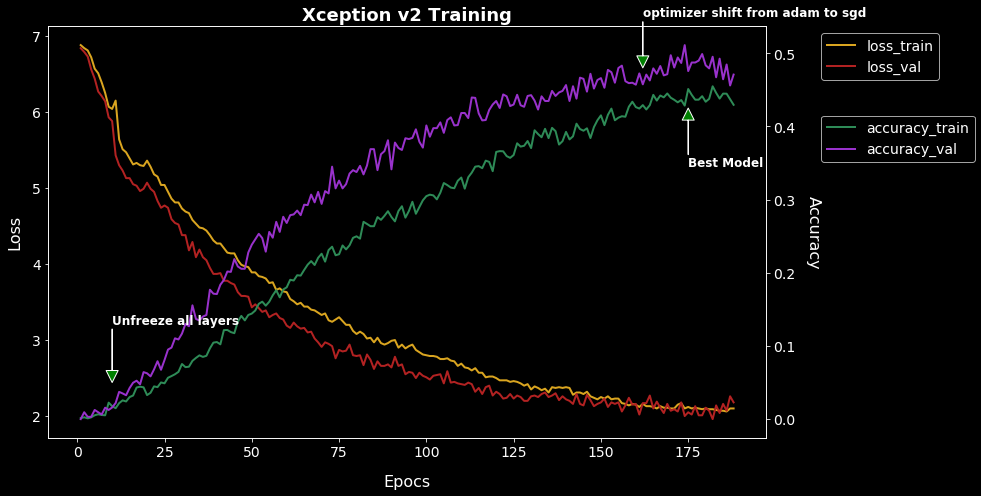

In [27]:
plt.rcParams["figure.figsize"] = (14,7)
plt.style.use("dark_background")

plt.plot(epocs, loss_train, markersize=3, linewidth=2, linestyle='-', color= "goldenrod")
plt.plot(epocs, loss_val, markersize=3, linewidth=2, linestyle='-', color= "firebrick")

plt.legend(["loss_train", "loss_val"], scatterpoints=1, loc= "upper right", fontsize=14,  ncol=1, bbox_to_anchor=(1.25, 1))
plt.title("Xception v2 Training", fontsize=18, fontweight='bold')

plt.xticks(fontsize=14)
plt.xlabel("Epocs", labelpad=15, fontsize=16)

plt.yticks(rotation="horizontal", fontsize=14)
plt.ylabel("Loss", labelpad=10, fontsize=16)

ax2 = plt.twinx() 
ax2.plot(epocs, accuracy_train, "-", linewidth=2, color="seagreen")
ax2.plot(epocs, accuracy_val, "-", linewidth=2, color="darkorchid")
ax2.set_ylabel('Accuracy', rotation=270, labelpad=25, fontsize=16)
ax2.legend(["accuracy_train", "accuracy_val"], scatterpoints=1, loc= "best", fontsize=14,  ncol=1, bbox_to_anchor=(1.3, 0.8))
ax2.set_yticklabels([round(num, 1) for num in list(np.arange(-0.1, 1, 0.1))],fontsize=14)

plt.annotate(s = "optimizer shift from adam to sgd", xy=(162, 0.48), xytext=(162, 0.48 + 0.07), fontsize=12, fontweight='bold',
           arrowprops=dict(facecolor='green', width=0.02))

plt.annotate(s = "Best Model", xy=(175, 0.425), xytext=(175, 0.425 - 0.08), fontsize=12, fontweight='bold',
           arrowprops=dict(facecolor='green', width=0.02))

plt.annotate(s = "Unfreeze all layers", xy=(10, 0.05), xytext=(10, 0.05 + 0.08), fontsize=12, fontweight='bold',
           arrowprops=dict(facecolor='green', width=0.02))

plt.tight_layout()

plt.savefig("figures/Xception_Training_version2.png", dpi=300, bbox_inches="tight")

plt.show()

**Model Evaluation**

In [45]:
model = keras.models.load_model("models/my_mushroom_model_xception_sgd_.h5")

In [32]:
list_classes = list(pd.Series(glob.glob('Clean_Final_DataSet_original/*')).str.split("\\", expand=True)[1].str.replace("_", " "))

In [43]:
img_size=600

In [44]:
# Create validation data generator

val_datagen = ImageDataGenerator(preprocessing_function=tf.keras.applications.xception.preprocess_input)

val_generator = val_datagen.flow_from_directory(
        'data_organized/val/',
        target_size=(img_size, img_size),
        batch_size=12,
        class_mode="categorical")

Found 22658 images belonging to 933 classes.


In [35]:
#Create validation test generator

test_datagen = ImageDataGenerator(preprocessing_function=tf.keras.applications.xception.preprocess_input)

test_generator = test_datagen.flow_from_directory(
        'data_organized/test/',
        target_size=(img_size, img_size),
        batch_size=1,
        class_mode="categorical",
        shuffle=False)

Found 8495 images belonging to 933 classes.


In [36]:
imgs, labels = next(val_generator)

In [8]:
# use this function to plot pictures from 1 x batch data


def plotImages(images_arr):
    fig, axes = plt.subplots(1, 10, figsize=(20,5))
    axes = axes.flatten()
    for img, ax in zip( images_arr, axes):
        ax.imshow(img)
        ax.axis('off')
    plt.tight_layout()
    plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

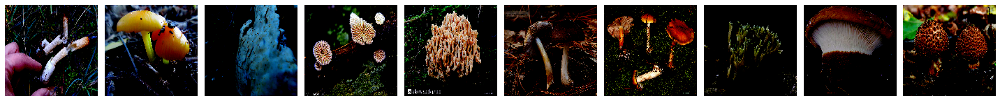

In [9]:
plotImages(imgs)

In [12]:
test_imgs, test_labels = next(test_generator)

In [13]:
test_generator.classes # the appear ordered bcos we specified shuffle=False when defining the test_generator

array([  0,   0,   0, ..., 932, 932, 932])

In [ ]:
predictions=model.predict(x=test_generator, verbose=0)

In [ ]:
loss, acc = model.evaluate(x=test_generator, verbose=0)
print("Final model -> accuracy: {:5.2f}%, loss: {:5.2f}".format(100*acc, loss)) 

Final model -> **accuracy: 48.1%**, loss:  2.06

In [ ]:
np.round(predictions)

**Check Performance for single pictures**

In [48]:
example_paths = glob.glob('Example_pictures_xception_2/*')

In [54]:
for path in example_paths:
    try:
        img = PIL.Image.open(path)
        img = img.resize((600,600))
        img.save(path)
    except OSError:
        pass

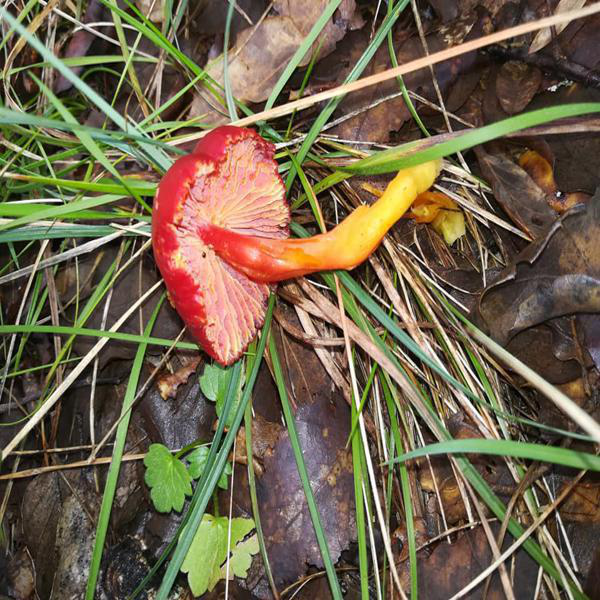

In [28]:
PIL.Image.open(r"E:\Projects\Github_mushroom_project\Example_pictures_xception_2\hygrocybe_coccinea.jpeg")

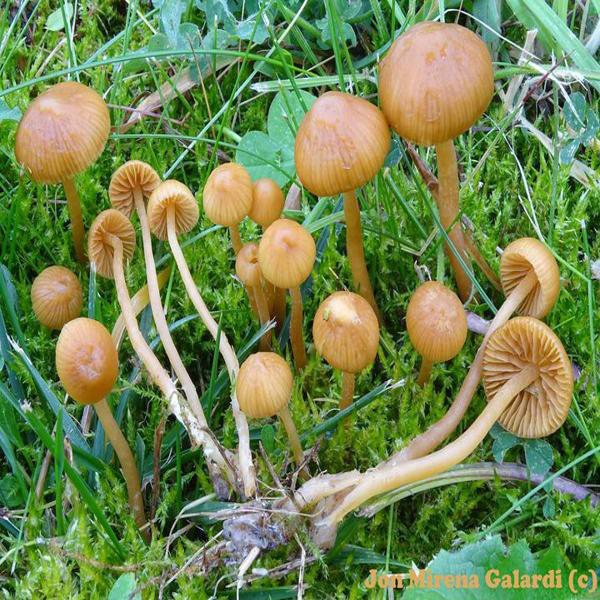

In [30]:
PIL.Image.open(r"E:\Projects\Github_mushroom_project\Example_pictures_xception_2\galerina_clavata_challenge.jpeg")

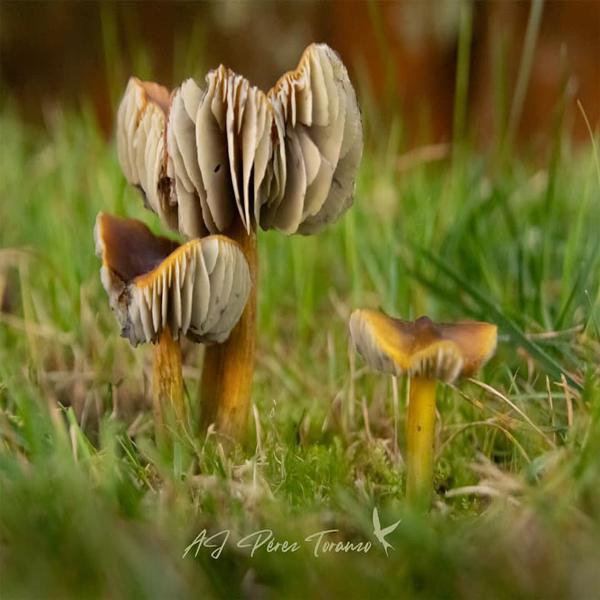

In [31]:
PIL.Image.open(r"E:\Projects\Github_mushroom_project\Example_pictures_xception_2\hygrocybe_tristis.jpeg")

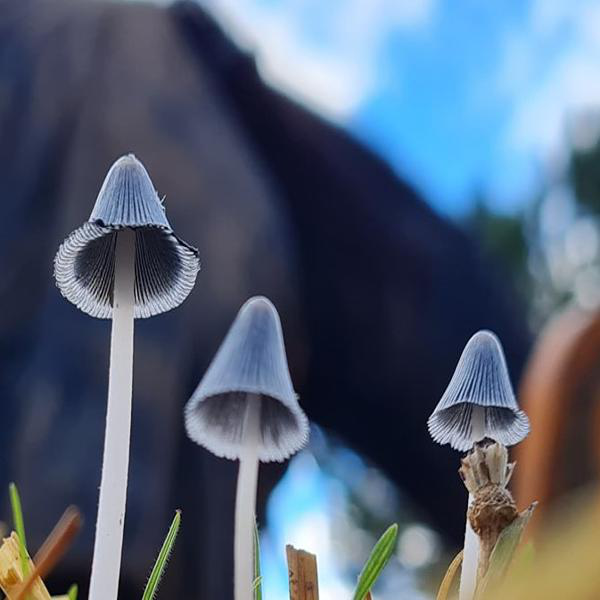

In [50]:
PIL.Image.open(r"E:\Projects\Github_mushroom_project\Example_pictures_xception_2\Coprinopsis_cineirea_cropped.jpeg")

In [37]:

def prepare_image(file):
    img_path = 'Example_pictures_xception_2/'
    img = image.load_img(img_path + file, target_size=(600, 600))
    img_array = image.img_to_array(img)
    img_array_expanded_dims = np.expand_dims(img_array, axis=0)
    return tf.keras.applications.xception.preprocess_input(img_array_expanded_dims)

In [38]:
preprocessed_hygrocybe_coccinea = prepare_image('hygrocybe_coccinea.jpeg')
predictions_hygrocybe_coccinea = model.predict(preprocessed_hygrocybe_coccinea)

preprocessed_image_galerina_clavata = prepare_image('galerina_clavata_challenge.jpeg')
predictions_galerina_clavata= model.predict(preprocessed_image_galerina_clavata)

preprocessed_image_hygrocybe_tristis = prepare_image('hygrocybe_tristis.jpeg')
predictions_hygrocybe_tristis = model.predict(preprocessed_image_hygrocybe_tristis)

preprocessed_image_Coprinopsis_cineirea = prepare_image('Coprinopsis_cineirea.jpeg')
predictions_Coprinopsis_cineirea = model.predict(preprocessed_image_Coprinopsis_cineirea)

preprocessed_image_Coprinopsis_cineirea_cropped = prepare_image('Coprinopsis_cineirea_cropped.jpeg')
predictions_Coprinopsis_cineirea_cropped = model.predict(preprocessed_image_Coprinopsis_cineirea_cropped)


In [39]:

def top_5_predictions(array, class_list):
    
    """function to retrieve the top 5 predictions """
    
    inx = array[0].argsort()[-5:][::-1] # getting the indexes of the top 5 predictions in descending order
    
    top_1 = array[0][inx[0]]*100
    top_2 = array[0][inx[1]]*100
    top_3 = array[0][inx[2]]*100
    top_4 = array[0][inx[3]]*100
    top_5 = array[0][inx[4]]*100
    
    class_1 = class_list[inx[0]]
    class_2 = class_list[inx[1]]
    class_3 = class_list[inx[2]]
    class_4 = class_list[inx[3]]
    class_5 = class_list[inx[4]]
    
    return print("Top 1 Prediction: With {:4.1f}% probability is a picture of {}.\nTop 2 Prediction: With {:4.1f}% probability is a picture of {}.\nTop 3 Prediction: With {:4.1f}% probability is a picture of {}.\nTop 4 Prediction: With {:4.1f}% probability is a picture of {}.\nTop 5 Prediction: With {:4.1f}% probability is a picture of {}."
                 .format(top_1, class_1, top_2, class_2, top_3, class_3, top_4, class_4, top_5, class_5))

In [40]:
top_5_predictions(predictions_hygrocybe_coccinea, list_classes) # we can see that our model has a very confident solution for this example

Top 1 Prediction: With 37.5% probability is a picture of Hygrocybe coccinea.
Top 2 Prediction: With 22.3% probability is a picture of Hygrocybe punicea.
Top 3 Prediction: With  9.2% probability is a picture of Hygrocybe miniata.
Top 4 Prediction: With  5.3% probability is a picture of Hygrocybe laeta.
Top 5 Prediction: With  3.9% probability is a picture of Hygrocybe conica.


In [41]:
top_5_predictions(predictions_galerina_clavata, list_classes)

Top 1 Prediction: With 73.8% probability is a picture of Galerina clavata.
Top 2 Prediction: With  6.5% probability is a picture of Hygrocybe laeta.
Top 3 Prediction: With  3.3% probability is a picture of Entoloma incanum.
Top 4 Prediction: With  3.1% probability is a picture of Rickenella  fibula.
Top 5 Prediction: With  2.4% probability is a picture of Rickenella fibula.


In [42]:
top_5_predictions(predictions_hygrocybe_tristis, list_classes)

Top 1 Prediction: With 20.0% probability is a picture of Hygrocybe tristis.
Top 2 Prediction: With 16.4% probability is a picture of Hygrocybe psittacina.
Top 3 Prediction: With 16.0% probability is a picture of Entoloma incanum.
Top 4 Prediction: With 14.4% probability is a picture of Hygrocybe conica.
Top 5 Prediction: With 12.5% probability is a picture of Gliophorus psittacinus.


In [44]:
top_5_predictions(predictions_Coprinopsis_cineirea_cropped, list_classes)

Top 1 Prediction: With 20.9% probability is a picture of Coprinopsis cinerea.
Top 2 Prediction: With 20.9% probability is a picture of Coprinus lagopus.
Top 3 Prediction: With 11.7% probability is a picture of Coprinus niveus.
Top 4 Prediction: With 11.3% probability is a picture of Coprinopsis ephemeroides.
Top 5 Prediction: With  7.7% probability is a picture of Coprinopsis radiata.


**The model was able to correctly identify all 4 mushrooms above**

**Evaluation Metrics on the test set:**

In [56]:
test_generator.classes

array([  0,   0,   0, ..., 932, 932, 932])

In [55]:
# array labels 
species = np.array(pd.Series(glob.glob('Clean_Final_DataSet_original/*')).str.split("\\", expand=True)[1].str.replace("_", " "))
# trues on one_hot encoded format
one_hot_trues = sklearn.preprocessing.OneHotEncoder(test_generator.classes)
# predictions on one_hot encoded format
one_hot_preds = np.round(predictions)

In [ ]:
classification_metrics = metrics.classification_report(y_true=y_trues, y_pred=preds, target_names=species, output_dict=True)
print(classification_metrics)

In [90]:
df_metrics_test.to_csv("metrics_test.csv",index=False)

In [91]:
df_metrics_test = pd.read_csv("metrics_test.csv")

In [92]:
df_metrics = df_metrics_test.drop([933, 934, 935, 936], axis=0) # dropping the last 4 rows

In [93]:
df_metrics.head()

,precision,recall,f1-score,support
0,1.000000,0.300000,0.461538,10.0
1,0.000000,0.000000,0.000000,11.0
2,0.714286,0.454545,0.555556,11.0
3,0.000000,0.000000,0.000000,8.0
4,1.000000,0.300000,0.461538,10.0


In [94]:
species_s = pd.Series(glob.glob('Clean_Final_DataSet_original/*')).str.split("\\", expand=True)[1].str.replace("_", " ")

In [95]:
df_metrics = pd.concat([df_metrics, species_s], axis=1)

In [97]:
df_metrics.columns = ["precision", "recall", "f1-score", "support", "species"]

In [101]:
df_metrics.sort_values(by=["precision", "recall", "f1-score"], ascending=False)

,precision,recall,f1-score,support,species
65,1.0,1.0,1.0,8.0,Arcyria obvelata
197,1.0,1.0,1.0,10.0,Colus hirudinosus
217,1.0,1.0,1.0,10.0,Coprinus picaceus
409,1.0,1.0,1.0,8.0,Humaria hemisphaerica
602,1.0,1.0,1.0,8.0,Melanogaster variegatus
...,...,...,...,...,...
921,0.0,0.0,0.0,8.0,Xerocomus armeniacus
922,0.0,0.0,0.0,10.0,Xerocomus chrysenteron
923,0.0,0.0,0.0,8.0,Xerocomus communis
924,0.0,0.0,0.0,9.0,Xerocomus lanatus


**Evaluation Metrics on the validation set:**

In [102]:
df_metrics_test = pd.read_csv("metrics_val.csv")

In [103]:
df_metrics = df_metrics_test.drop([933, 934, 935, 936], axis=0) # dropping the last 4 rows

In [104]:
df_metrics.head()

,precision,recall,f1-score,support
0,0.0,0.0,0.0,28.0
1,0.0,0.0,0.0,28.0
2,0.0,0.0,0.0,28.0
3,0.0,0.0,0.0,24.0
4,0.0,0.0,0.0,25.0


In [67]:
species_s = pd.Series(glob.glob('Clean_Final_DataSet_original/*')).str.split("\\", expand=True)[1].str.replace("_", " ")

In [106]:
df_metrics = pd.concat([df_metrics, species_s], axis=1)

In [107]:
df_metrics.columns = ["precision", "recall", "f1-score", "support", "species"]

In [108]:
df_metrics.sort_values(by=["precision", "recall", "f1-score"], ascending=False)

,precision,recall,f1-score,support,species
184,0.500000,0.037037,0.068966,27.0,Clitopilus prunulus
475,0.090909,0.040000,0.055556,25.0,Inonotus dryadeus
895,0.071429,0.041667,0.052632,24.0,Tricholoma terreum
858,0.071429,0.035714,0.047619,28.0,Suillus grevillei
354,0.066667,0.043478,0.052632,23.0,Geastrum quadrifidum
...,...,...,...,...,...
928,0.000000,0.000000,0.000000,22.0,Xerula radicata
929,0.000000,0.000000,0.000000,22.0,Xylaria carpophila
930,0.000000,0.000000,0.000000,25.0,Xylaria hypoxylon
931,0.000000,0.000000,0.000000,27.0,Xylaria longipes


**Next, let's further look into the missclassified pictures/species.** **What are the species with highest number of missclassification?** 

In [ ]:
# taking the best result for each prediction
preds = []
for i in range(predictions.shape[0]):
    pred = np.argmax(predictions[i])
    preds.append(pred)

In [ ]:
num_labels = list(test_generator.classes)

In [ ]:
y_pred_serie = pd.Series(preds)
y_test_serie = pd.Series(num_labels)

species_serie_true=[]
for i in y_test_serie:
    species_serie_true.append(species_s[i])
    
species_serie_pred=[]
for i in y_pred_serie:
    species_serie_pred.append(species_s[i])

species_serie_true = pd.Series(species_serie_true)
species_serie_pred = pd.Series(species_serie_pred)
    

In [ ]:
df_preds = pd.concat([species_serie_true,species_serie_pred], axis=1)

In [ ]:
df_preds.columns = ["real", "predicted"]

In [ ]:
df_preds.to_csv("df_preds.csv", index=False)

In [29]:
df_preds = pd.read_csv("df_preds.csv")

In [30]:
df_preds.head()

,real,predicted
0,Hygrocybe punicea,Boletus speciosus
1,Hygrocybe punicea,Melanogaster variegatus
2,Hygrocybe punicea,Hygrocybe punicea
3,Hygrocybe punicea,Stropharia squamosa
4,Hygrocybe punicea,Hygrocybe punicea


In [110]:
df_missclass = df_preds.loc[(df_preds["real"] != df_preds["predicted"])]

In [113]:
counts = df_missclass["real"].value_counts()

In [119]:
counts = pd.DataFrame(counts).reset_index()

In [120]:
counts.columns = ["species", "number"]

In [152]:
high_miss = counts.loc[counts["number"]>9]

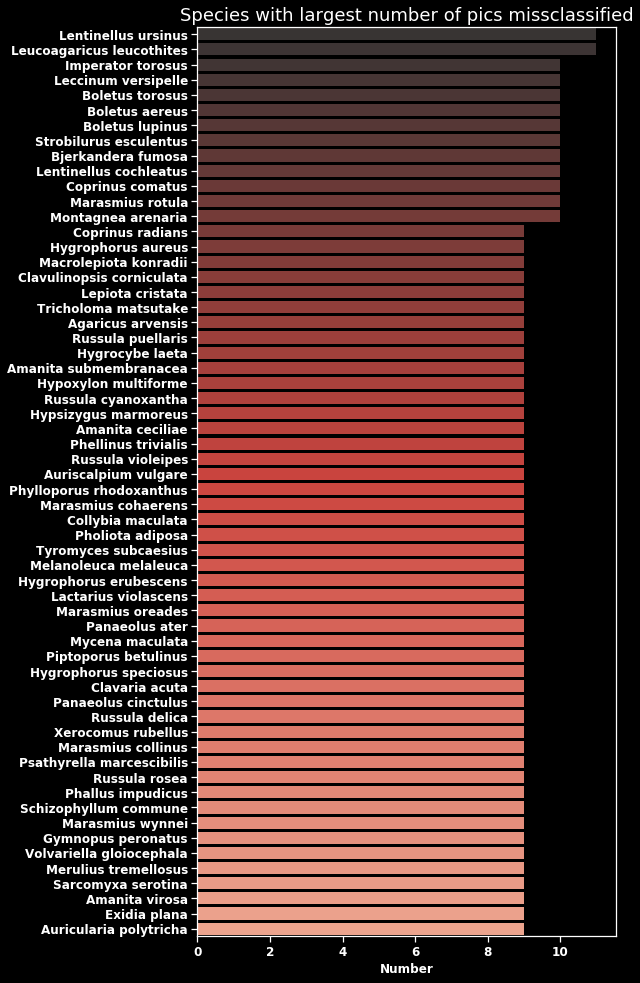

In [157]:
plt.style.use("dark_background")
plt.rcParams["figure.figsize"] = (9,14)
plt.title("Species with largest number of pics missclassified")
sns.set_context("notebook", font_scale=1.5)
sns.barplot(x="number", y="species", data=high_miss, palette="Reds_d")
#plt.legend(bbox_to_anchor=(1, 1),loc= "best", fontsize=18,  ncol=1)
plt.ylabel("")
plt.yticks(fontsize=12, fontweight='bold')
plt.xlabel("Number", fontsize=12, fontweight='bold')
plt.xticks(fontsize=12, fontweight='bold')
plt.tight_layout()
plt.savefig("figures/missclassified_mush.png", dpi=300, bbox_inches="tight")
plt.show()

**Now lets check what is the accuracy of the model in guessing the correct mushroom in the top 5 results.**

In [46]:
predictions=model.predict(x=val_generator, verbose=0)

In [ ]:
predictions=model.predict(x=test_generator, verbose=0)

In [ ]:
# creating a list of lists with the top 5 results for each prediction on the test set
pred_top_5 = []
for i in range(predictions.shape[0]):
    top5 = list(predictions[i].argsort()[-5:][::-1])
    pred_top_5.append(top5)

In [ ]:
true_labels = list(test_generator.classes)

In [ ]:
pred_correct = []
for i in range(predictions.shape[0]):
    if true_labels[i] in pred_top_5[i]:
        pred_correct.append(true_labels[i]) # return true label if prediction in top 5
    else:
        pred_correct.append(pred_top_5[i][0]) # return top prediction if true label not in top 5

In [ ]:
species_names = pd.Series(glob.glob('Clean_Final_DataSet_original/*')).str.split("\\", expand=True)[1].str.replace("_", " ")

In [ ]:
# converting the numeric labels into the scientific name
species_true=[]
for i in true_labels:
    species_true.append(species_names[i])
    
species_pred=[]
for i in pred_correct:
    species_pred.append(species_names[i])

species_serie_true = pd.Series(species_true)
species_serie_pred = pd.Series(species_pred)

In [ ]:
df_preds = pd.concat([species_serie_true,species_serie_pred], axis=1)

In [ ]:
df_preds.columns = ["real", "predicted"]

In [ ]:
df_preds.to_csv("df_preds_top5.csv", index=False)

In [31]:
df_preds = pd.read_csv("df_preds_top5.csv")

In [32]:
df_missclass = df_preds.loc[(df_preds["real"] != df_preds["predicted"])]

In [ ]:
(df_missclass.shape[0]/df_preds.shape[0])*100

**21 %** Of mushroom species were not found in the top 5 results provided by the algorithm

In [34]:
counts = df_missclass["real"].value_counts()

In [35]:
counts = pd.DataFrame(counts).reset_index()

In [36]:
counts.columns = ["species", "number"]

In [37]:
high_miss = counts.loc[counts["number"]>5]

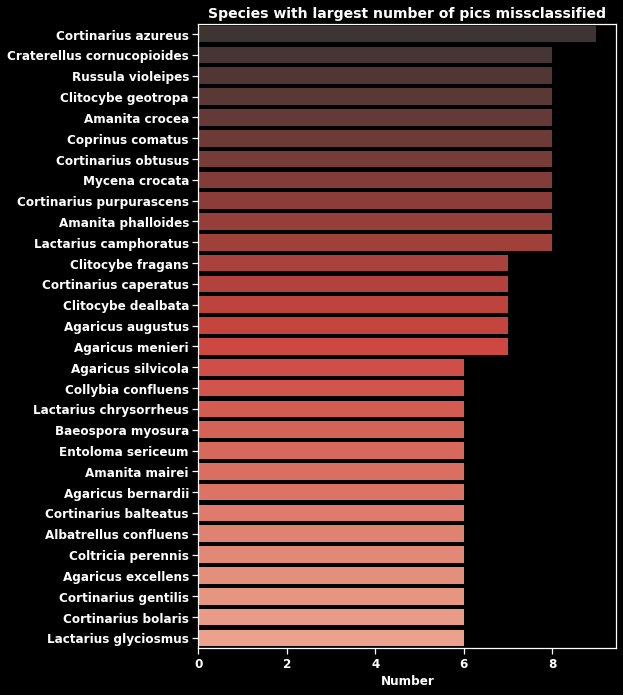

In [41]:
plt.style.use("dark_background")
plt.rcParams["figure.figsize"] = (9,10)
plt.title("Species with largest number of pics missclassified", fontsize=14, fontweight='bold')
sns.set_context("notebook", font_scale=1.5)
sns.barplot(x="number", y="species", data=high_miss, palette="Reds_d")
#plt.legend(bbox_to_anchor=(1, 1),loc= "best", fontsize=18,  ncol=1)
plt.ylabel("")
plt.yticks(fontsize=12, fontweight='bold')
plt.xlabel("Number", fontsize=12, fontweight='bold')
plt.xticks(fontsize=12, fontweight='bold')
plt.tight_layout()
plt.savefig("figures/missclassified_mush_ontop5.png", dpi=300, bbox_inches="tight")
plt.show()

**Not surprisingly most of the mushroom species missclassified belong to the genus with largest number of species (i.e Agaricus: 16 species, Amanita: 36 species, Lactarius: 38, Russula: 40 and Cortinarius: 48)**